# ABDEC2024 数据预处理

## 数据准备

APF数据下载地址：


https://wltransfer.s3.cn-north-1.amazonaws.com.cn/apf.tar.gz

下载后在终端里用 tar zxvf apf.tar.gz 命令解压缩，解压缩后原始数据在 apf/目录下，共181个.fits文件

原始数据存放的路径为 ``data/apf/2013-10-10``

In [123]:
import os
rawpath = 'data/apf.levy/2013-10-10'
for fname in sorted(os.listdir(rawpath)):
    print(fname)

ucsc57000.fits
ucsc57001.fits
ucsc57002.fits
ucsc57003.fits
ucsc57004.fits
ucsc57005.fits
ucsc57006.fits
ucsc57007.fits
ucsc57008.fits
ucsc57009.fits
ucsc57010.fits
ucsc57011.fits
ucsc57012.fits
ucsc57013.fits
ucsc57014.fits
ucsc57015.fits
ucsc57016.fits
ucsc57017.fits
ucsc57018.fits
ucsc57019.fits
ucsc57020.fits
ucsc57021.fits
ucsc57022.fits
ucsc57023.fits
ucsc57024.fits
ucsc57025.fits
ucsc57026.fits
ucsc57027.fits
ucsc57028.fits
ucsc57029.fits
ucsc57030.fits
ucsc57031.fits
ucsc57032.fits
ucsc57033.fits
ucsc57034.fits
ucsc57035.fits
ucsc57036.fits
ucsc57037.fits
ucsc57038.fits
ucsc57039.fits
ucsc57040.fits
ucsc57041.fits
ucsc57042.fits
ucsc57043.fits
ucsc57044.fits
ucsc57045.fits
ucsc57046.fits
ucsc57047.fits
ucsc57048.fits
ucsc57049.fits
ucsc57050.fits
ucsc57051.fits
ucsc57052.fits
ucsc57053.fits
ucsc57054.fits
ucsc57055.fits
ucsc57056.fits
ucsc57057.fits
ucsc57058.fits
ucsc57059.fits
ucsc57060.fits
ucsc57061.fits
ucsc57062.fits
ucsc57063.fits
ucsc57064.fits
ucsc57065.fits
ucsc57066.

## APF原始数据的预处理

### 读入观测日志文件

这一天的数据对应的观测日志文件为 ``l06.logsheet43``

In [101]:
file = open('data/apf.levy/l06.logsheet43')
for row in file:
    print(row.strip())
file.close()


Observer:Burt                Tape:L06 Night:43 Telescope: APF
UT Date:10 Oct 2013          Chip: E2V
Windowing:  Cols: 4608       Rows: 2080    binning: 1x2
Slit: 1.0 x 3.5 arcsec, 2.0 x 7.5 aresec        Focus: 10,100
FWHM(I2)=???      Gain = 1.031,  overscan=32
--------------------------------------------------------------------------
nn.fits Object  I2   Mid-Time  Exp.   Decker  Geo-Time   M2Foc  Comments:
number   Name  (y/n)   (UT)    time

7000   Iodine       y  19:57:48    40 1.0x3.0 19:57:48 -1.000 17.44
7001   Iodine       y  19:59:12    40 1.0x3.0 19:59:12 -1.000 17.46
7002   Iodine       y  20:00:36    40 1.0x3.0 20:00:36 -1.000 17.43
7003   Iodine       y  20:02:00    40 1.0x3.0 20:02:00 -1.000 17.45
7004   Iodine       y  20:03:24    40 1.0x3.0 20:03:24 -1.000 17.46
7005   Iodine       y  20:04:48    40 1.0x3.0 20:04:48 -1.000 17.43
7006   Iodine       y  20:06:13    40 1.0x3.0 20:06:12 -1.000 17.45
7007   Iodine       y  20:07:37    40 1.0x3.0 20:07:36 -1.000 17.46
7008  

In [102]:
import re
file = open('data/apf.levy/l06.logsheet43')
for row in file:
    pattern = '(\d+)\s+([a-zA-Z0-9]+)\s+([yn])\s+(\d\d:\d\d:\d\d)\s+(\d+)\s+(\S+)'
    mobj = re.match(pattern, row.strip())
    if mobj:
        frameid = int(mobj.group(1))
        objname = mobj.group(2)
        i2      = mobj.group(3)
        midtime = mobj.group(4)
        exptime = float(mobj.group(5))
        decker  = mobj.group(6)
        print(frameid, '{:12s}'.format(objname), i2, midtime, '{:6g}'.format(exptime))
file.close()

7000 Iodine       y 19:57:48     40
7001 Iodine       y 19:59:12     40
7002 Iodine       y 20:00:36     40
7003 Iodine       y 20:02:00     40
7004 Iodine       y 20:03:24     40
7005 Iodine       y 20:04:48     40
7006 Iodine       y 20:06:13     40
7007 Iodine       y 20:07:37     40
7008 Iodine       y 20:09:01     40
7009 Iodine       y 20:10:25     40
7010 Iodine       y 20:11:49     40
7011 Iodine       y 20:13:13     40
7012 Iodine       y 20:14:37     40
7013 WideFlat     n 20:16:01     40
7014 WideFlat     n 20:17:25     40
7015 WideFlat     n 20:18:49     40
7016 WideFlat     n 20:20:15     40
7017 WideFlat     n 20:21:39     40
7018 NarrowFlat   n 20:27:43    600
7019 NarrowFlat   n 20:38:29    600
7102 7727         y 10:04:31    900
7103 9407         y 10:24:48    789
7104 9407         y 10:38:45    900
7105 12846        y 10:56:00    900
7106 HIP10449     y 11:17:40    900
7107 HIP14810     y 11:37:08    900
7108 HIP14810     y 11:55:31    900
7109 28005        y 12:15:49

把观测日志中的信息转换成 astropy 表格

In [135]:
import re
from astropy.table import Table

def read_obslog(filename):
    pattern = '(\d+)\s+([a-zA-Z0-9]+)\s+([yn])\s+(\d\d:\d\d:\d\d)\s+(\d+)\s+(\S+)'
    
    logtable = Table(dtype=[
        ('frameid', int),
        ('object',  str),
        ('i2',      str),
        ('midtime', str),
        ('exptime', float),
        ('decker',  str),
    ])
    
    file = open(filename)
    for row in file:
        mobj = re.match(pattern, row.strip())
        if mobj:
            frameid = int(mobj.group(1))
            objname = mobj.group(2)
            i2      = mobj.group(3)
            midtime = mobj.group(4)
            exptime = float(mobj.group(5))
            decker  = mobj.group(6)
            
            logtable.add_row((frameid, objname, i2, midtime, exptime, decker))
    file.close()
    return logtable


logtable = read_obslog('data/apf.levy/l06.logsheet43')
print(logtable)

logtable.write('apflog.txt', format='ascii.fixed_width_two_line', overwrite=True)

frameid   object    i2 midtime  exptime  decker
------- ---------- --- -------- ------- -------
   7000     Iodine   y 19:57:48    40.0 1.0x3.0
   7001     Iodine   y 19:59:12    40.0 1.0x3.0
   7002     Iodine   y 20:00:36    40.0 1.0x3.0
   7003     Iodine   y 20:02:00    40.0 1.0x3.0
   7004     Iodine   y 20:03:24    40.0 1.0x3.0
   7005     Iodine   y 20:04:48    40.0 1.0x3.0
   7006     Iodine   y 20:06:13    40.0 1.0x3.0
   7007     Iodine   y 20:07:37    40.0 1.0x3.0
   7008     Iodine   y 20:09:01    40.0 1.0x3.0
   7009     Iodine   y 20:10:25    40.0 1.0x3.0
    ...        ... ...      ...     ...     ...
   7171     Iodine   y 14:44:37    40.0 1.0x3.0
   7172     Iodine   y 14:46:01    40.0 1.0x3.0
   7173     Iodine   y 14:47:25    40.0 1.0x3.0
   7174   WideFlat   n 14:48:49    40.0 2.0x8.0
   7175   WideFlat   n 14:50:14    40.0 2.0x8.0
   7176   WideFlat   n 14:51:38    40.0 2.0x8.0
   7177   WideFlat   n 14:53:02    40.0 2.0x8.0
   7178   WideFlat   n 14:54:26    40.0 

### 查看原始数据的FITS头信息

In [112]:
import astropy.io.fits as fits

rawpath = 'data/apf.levy/2013-10-10'
hdulst = fits.open(os.path.join(rawpath, 'ucsc57007.fits'))
print(hdulst)

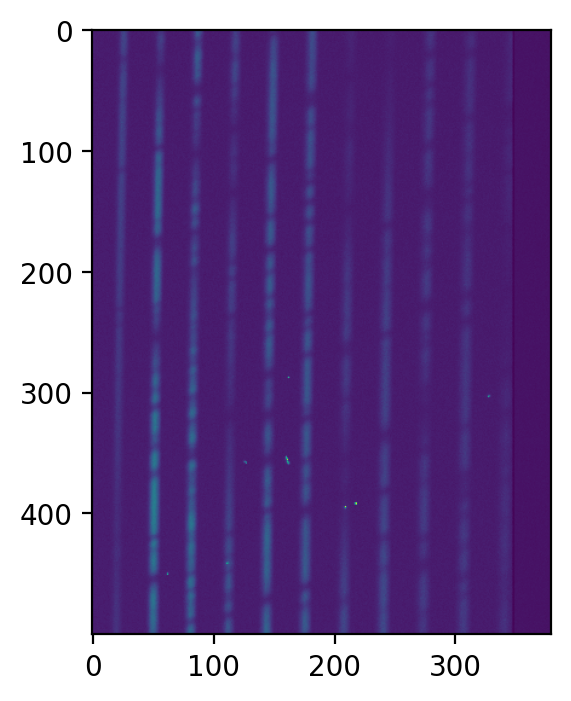

In [181]:
filename = os.path.join(rawpath, 'ucsc57091.fits')
hdulst = fits.open(filename)
head = hdulst[0].header
data = hdulst[0].data


fig = plt.figure(dpi=200)
ax = fig.gca()
ax.imshow(np.log(data[1000:1500,1700: ]))
plt.show()


In [182]:
print(head.cards)

('SIMPLE', True, 'NORMAL FITS IMAGE')
('BITPIX', 16, 'DATA PRECISION')
('NAXIS', 2, 'NUMBER OF IMAGE DIMENSIONS')
('NAXIS1', 2080, 'NUMBER OF COLUMNS')
('NAXIS2', 4608, 'NUMBER OF ROWS')
('CRVAL1U', 0, 'COLUMN ORIGIN')
('CRVAL2U', 0, 'ROW ORIGIN')
('CDELT1U', 1, 'COLUMN CHANGE PER PIXEL')
('CDELT2U', 1, 'ROW CHANGE PER PIXEL')
('OBSNUM', 56241, 'OBSERVATION NUMBER')
('IDNUM', 1, 'IMAGE ID')
('UGEOM', 1, 'UCAM READOUT GEOMETRY')
('DGEOM', 1, 'DESCRAMBLE GEOMETRY')
('AMPSROW', 1, 'AMPLIFIERS PER ROW')
('AMPSCOL', 1, 'AMPLIFIERS PER COLUMN')
('OBSTYPE', 'OBJECT', 'IMAGE TYPE')
('EXPTIME', 75.81, 'Exp time (not counting shutter error)')
('BSCALE', 1, 'DATA SCALE FACTOR')
('BZERO', 32768, 'DATA ZERO POINT')
('COMMENT', '   Real Value = FITS*BSCALE+BZERO', '')
('PROGRAM', 'NEWCAM', 'New Lick Camera')
('VERSION', 'apf', 'Data acquisition version')
('TSEC', 1381396110, 'CLOCK TICK - SECONDS')
('TUSEC', 84620, 'CLOCK TICK - MICROSECONDS')
('DATE', '2013-10-10T09:08:30.08', 'UT of CCD readout & 

### 判断光谱的红端和蓝端

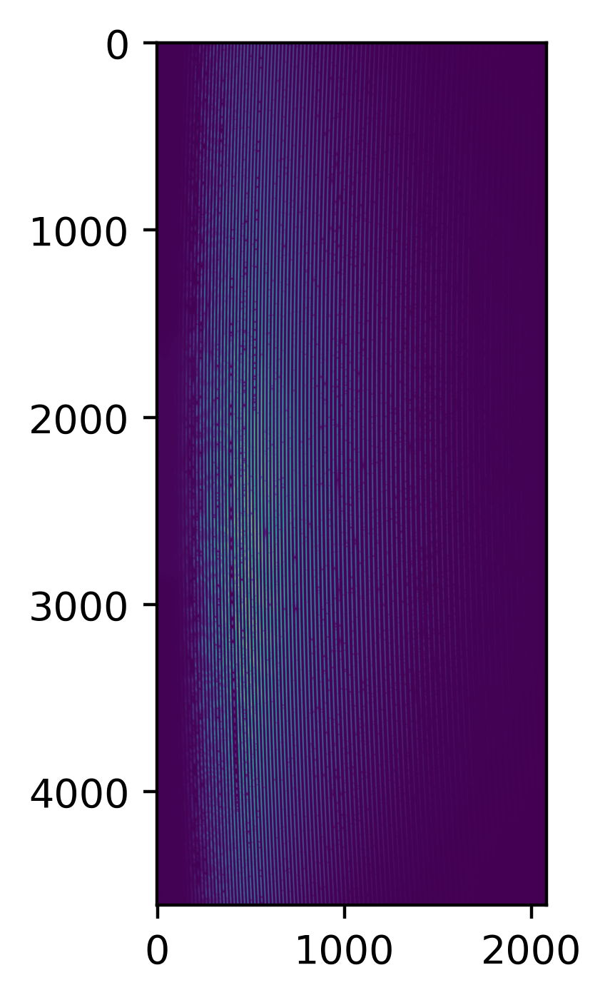

In [128]:
fig = plt.figure(dpi=400)
ax = fig.gca()
ax.imshow(data)
plt.show()

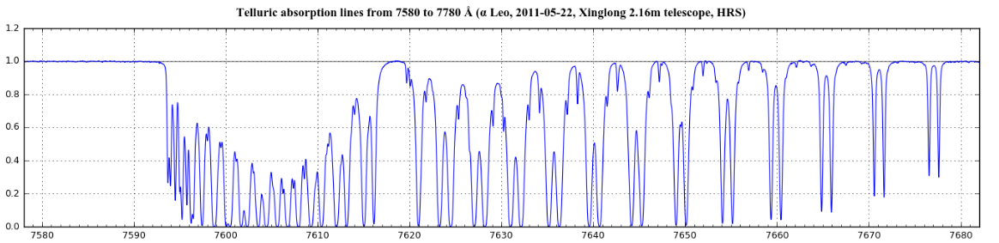

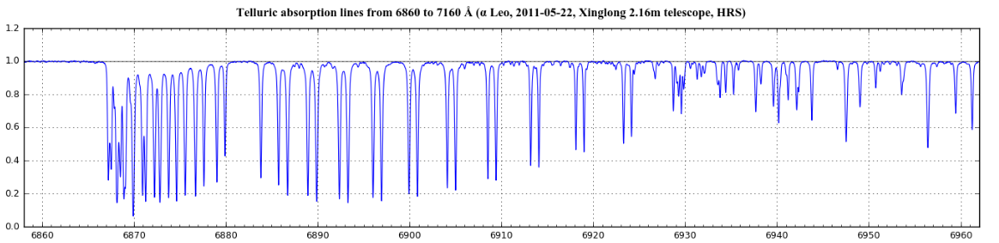

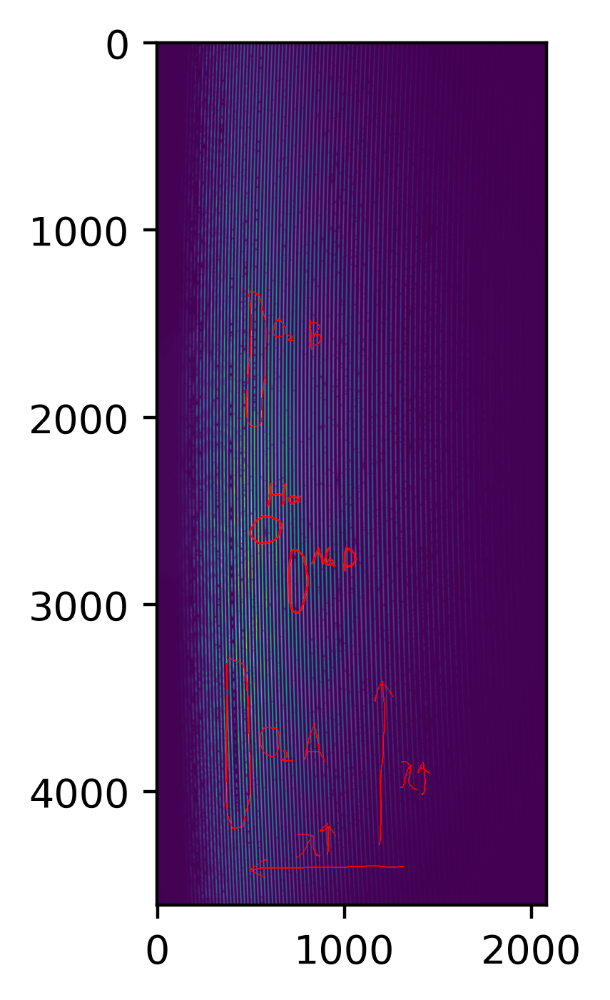

### Overscan改正

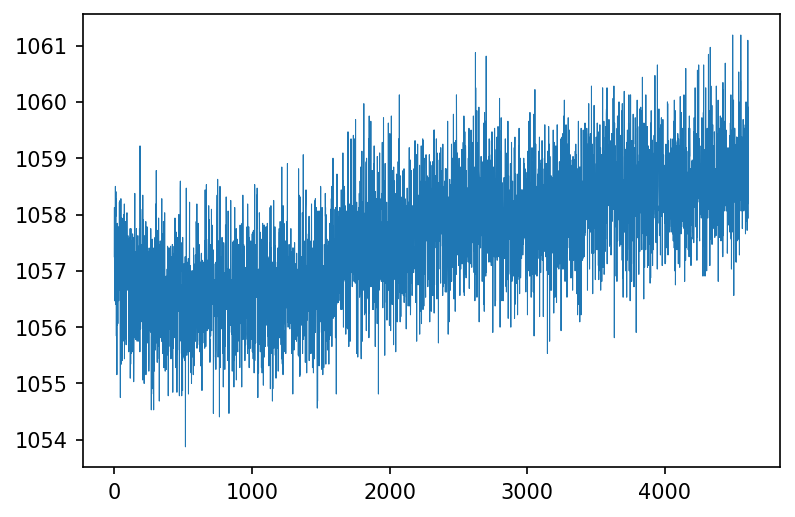

In [115]:
overmean = data[:, 2048:].mean(axis=1)

fig = plt.figure(dpi=150)
ax  = fig.gca()
ax.plot(overmean, lw=0.5)

用Sav-golay filter对 overscan进行平滑

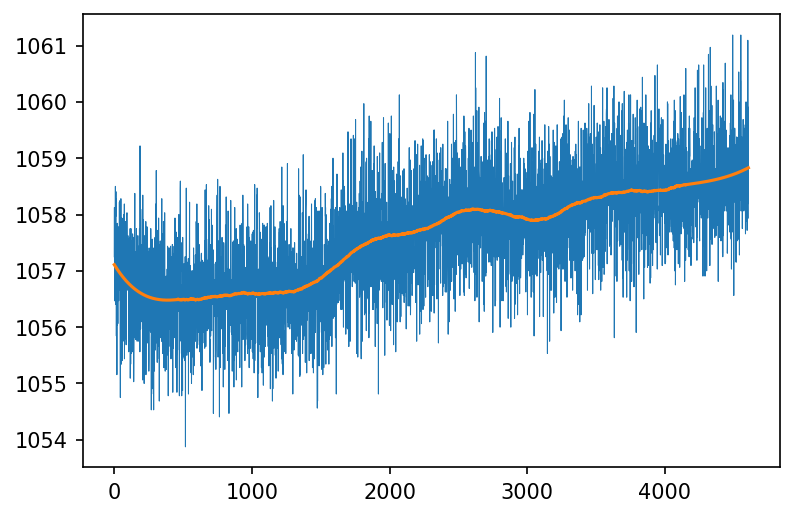

In [117]:
from scipy.signal import savgol_filter
oversmooth = savgol_filter(overmean, window_length=901, polyorder=3)

fig = plt.figure(dpi=150)
ax  = fig.gca()
ax.plot(overmean, lw=0.5)
ax.plot(oversmooth)

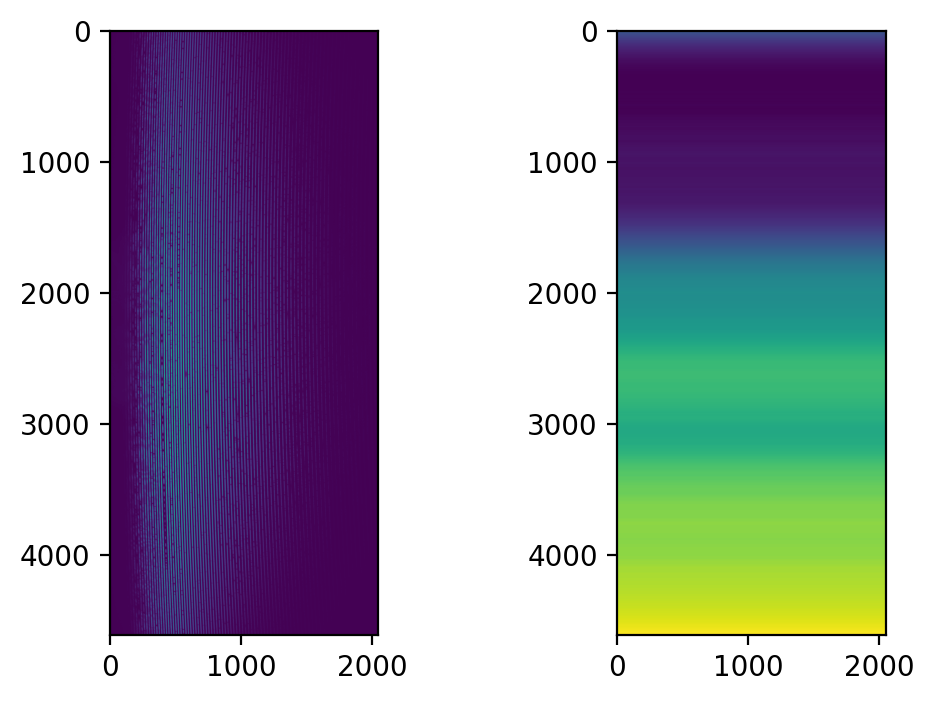

In [118]:
overdata = oversmooth.repeat(2048).reshape(-1, 2048)

scidata = data[:, 0:2048]

fig = plt.figure(dpi=200)
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(scidata)
ax2.imshow(overdata)

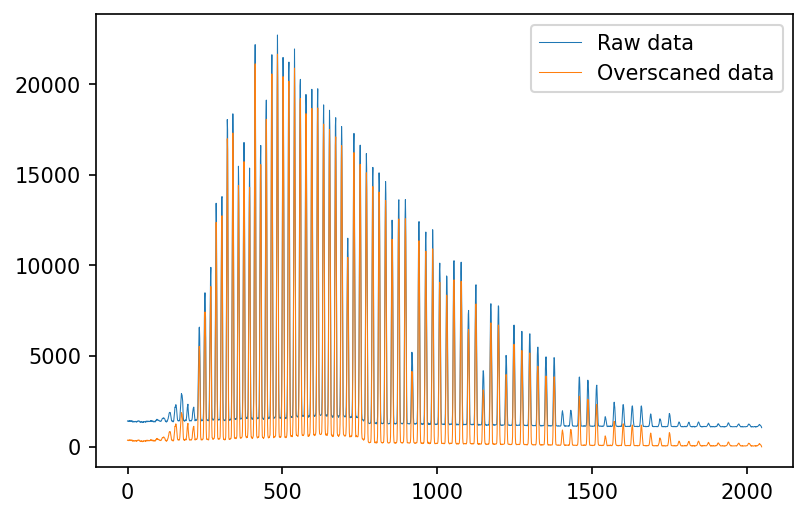

In [131]:

newdata = scidata - overdata

fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(scidata[2000], lw=0.5, label='Raw data')
ax.plot(newdata[2000], lw=0.5, label='Overscaned data')
ax.legend()
plt.show()

下面将overscan改正写成一个函数

In [122]:
def correct_overscan(data):
    overmean = data[:, 2048:].mean(axis=1)
    oversmooth = savgol_filter(overmean, window_length=901, polyorder=3)
    overdata = oversmooth.repeat(2048).reshape(-1, 2048)
    scidata = data[:, 0:2048]
    return scidata - overdata

### 级次定位

在观测日志中寻找 NarrowFlat，做overscan后进行合并

3953.0
3958.0
3971.0
3971.0


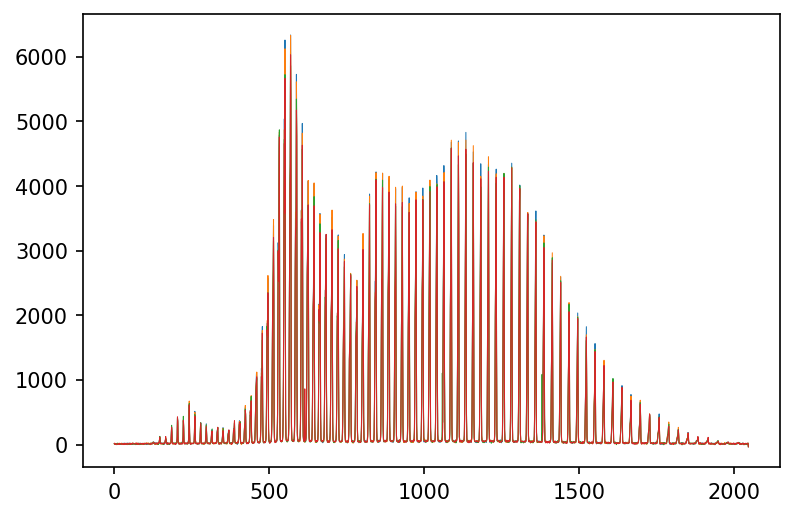

In [183]:
data_lst = []

fig = plt.figure(dpi=150)
ax = fig.gca()
for item in logtable:
    if item['object']!='NarrowFlat':
        continue
    filename = os.path.join(rawpath, 'ucsc5{}.fits'.format(item['frameid']))
    data = fits.getdata(filename)
    newdata = correct_overscan(data)
    data_lst.append(newdata)

    ax.plot(newdata[1000], lw=0.5)
    print(np.percentile(data, 95))
    
plt.show()


data_lst = np.array(data_lst)

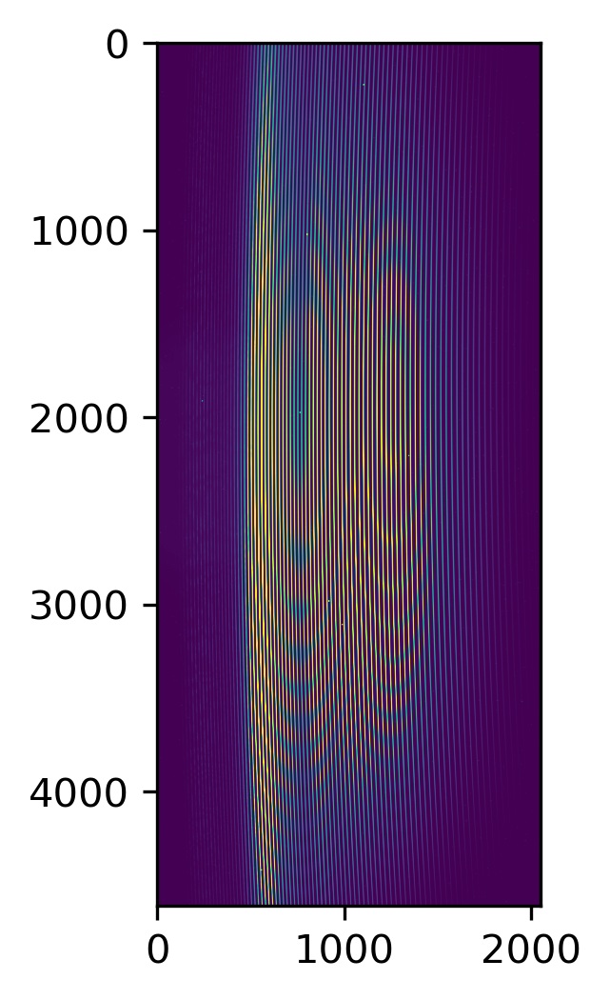

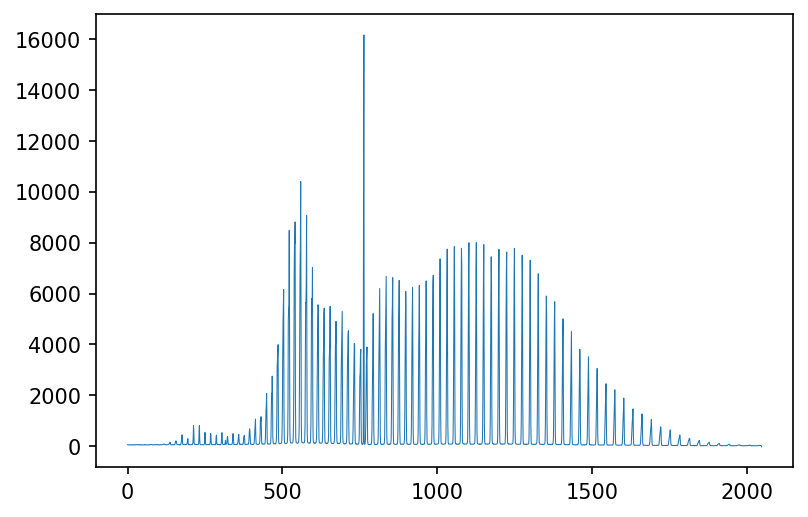

In [293]:
trace = data_lst.mean(axis=0)

hdulst = fits.HDUList([fits.PrimaryHDU(data=trace)])
hdulst.writeto('narrow_coadd.fits', overwrite=True)

fig1 = plt.figure(dpi=300)
ax1 = fig1.gca()
ax1.imshow(trace, vmin=np.percentile(trace,5), vmax=np.percentile(trace,95))

fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(trace[1973], lw=0.5)
#ax.set_xlim(500, 700)
plt.show()

plt.show()

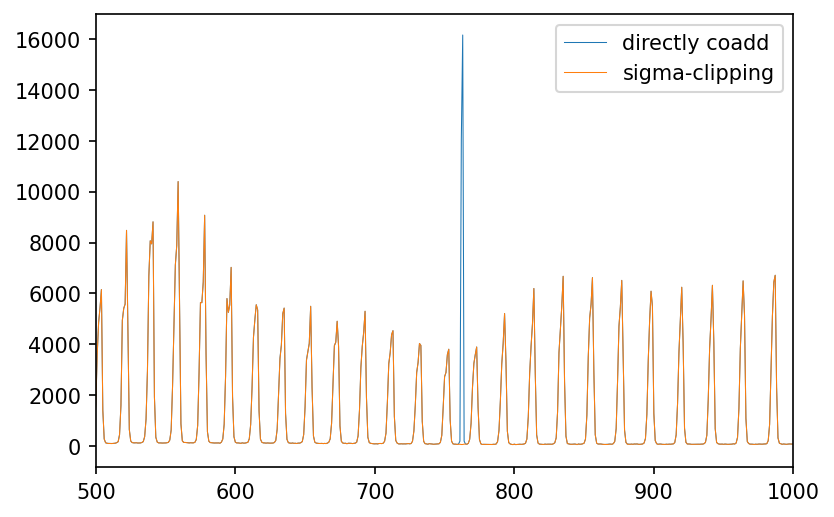

In [335]:
nz, ny, nx = data_lst.shape

mask = (np.mgrid[0:nz, 0:ny, 0:nx][0] == data_lst.argmax(axis=0))

for i in range(5):
    mdata = np.ma.masked_array(data_lst, mask=mask)
    mean = mdata.mean(axis=0).data
    std  = mdata.std(axis=0).data
    newmask = data_lst > mean + 5*std
    if mask.sum()==newmask.sum():
        break
    mask = newmask


newtrace = np.ma.masked_array(data_lst, mask=newmask).mean(axis=0).data

fig = plt.figure(dpi=150)
ax = fig.gca()
#ax.imshow(trace)
ax.plot(trace[1973], lw=0.5, label='directly coadd')
ax.plot(newtrace[1973], lw=0.5, label='sigma-clipping')
ax.set_xlim(500, 1000)
ax.legend()

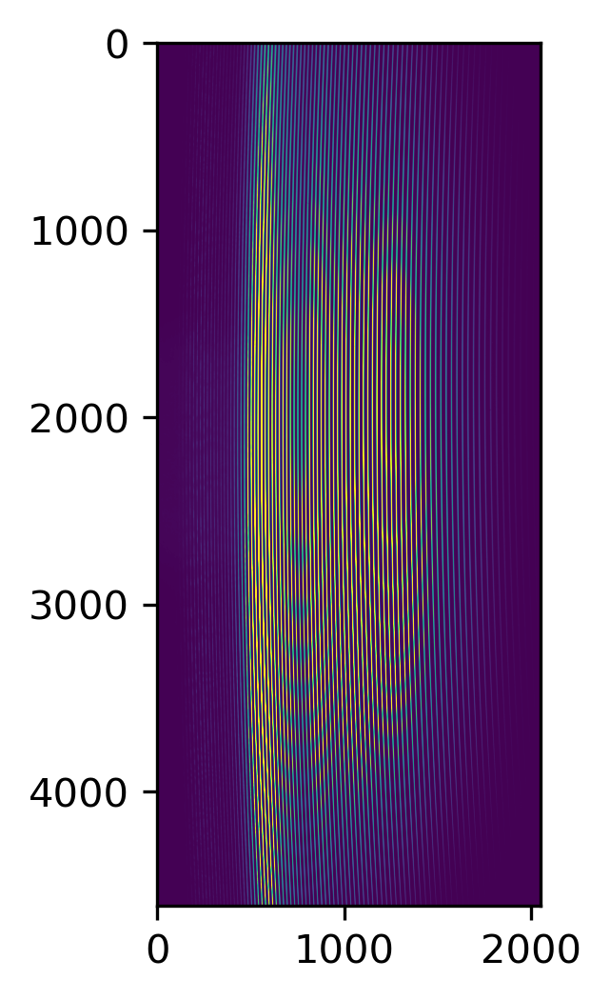

In [245]:
hdulst = fits.HDUList(fits.PrimaryHDU(data=newtrace))
hdulst.writeto('trace.fits', overwrite=True)

fig1 = plt.figure(dpi=300)
ax1 = fig1.gca()
ax1.imshow(newtrace, vmin=np.percentile(newtrace,5), vmax=np.percentile(newtrace,95))
plt.show()

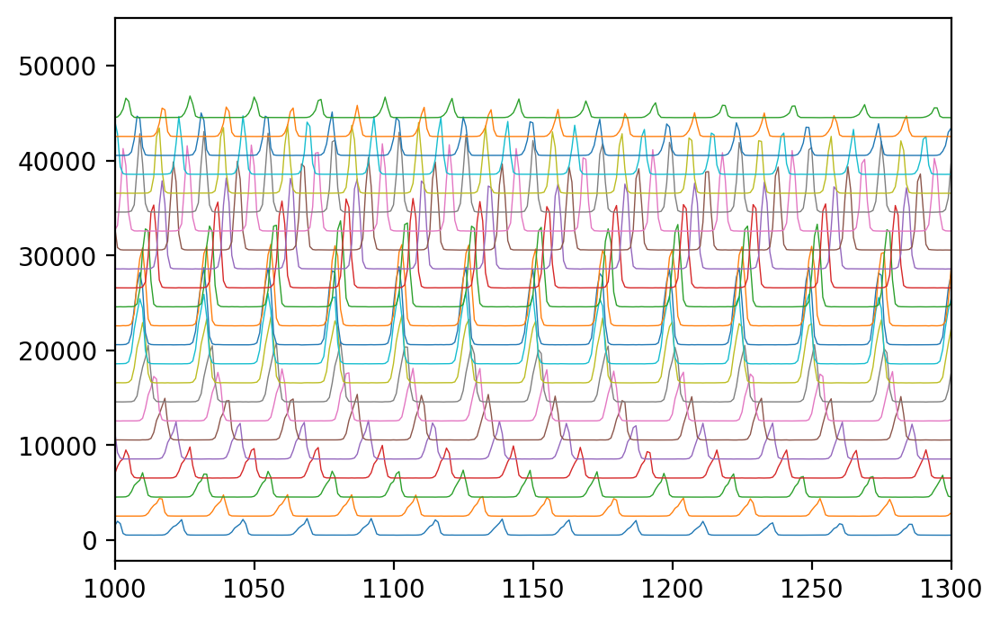

In [260]:
ny, nx = newtrace.shape

fig = plt.figure(dpi=200)
ax = fig.gca()

for i, y in enumerate(np.arange(50, ny, 200)):
    ax.plot(newtrace[y] + y*10, lw=0.5)

ax.set_xlim(1000, 1300)
plt.show()

In [280]:
from gamse.echelle.trace import find_apertures, TraceFigureCommon

class TraceFigure(TraceFigureCommon):
    """Figure to plot the order tracing.
    """
    def __init__(self, datashape, figsize=(12,6)):
        TraceFigureCommon.__init__(self, figsize=figsize, dpi=150)

        axh = 0.85
        axw = axh/figsize[0]*figsize[1]/datashape[0]*datashape[1]
        x1 = 0.06
        self.ax1 = self.add_axes([x1,0.07,axw,axh])

        hgap = 0.06
        x2 = x1 + axw + hgap
        self.ax2 = self.add_axes([x2, 0.50, 0.93-x2, 0.40])
        self.ax3 = self.add_axes([x2, 0.10, 0.93-x2, 0.40])
        self.ax4 = self.ax3.twinx()

mask = np.zeros_like(newtrace, dtype=np.int16)

fig_trace = TraceFigure(datashape=newtrace.shape)
aperset = find_apertures(newtrace, mask, transpose=True, scan_step=200, minimum=8,
               separation='200:15, 500:15, 1200:21, 2000:29',
               align_deg=2, filling=0.3, degree=3, display=False, fig_trace=fig_trace)
fig_trace.savefig('trace.png')


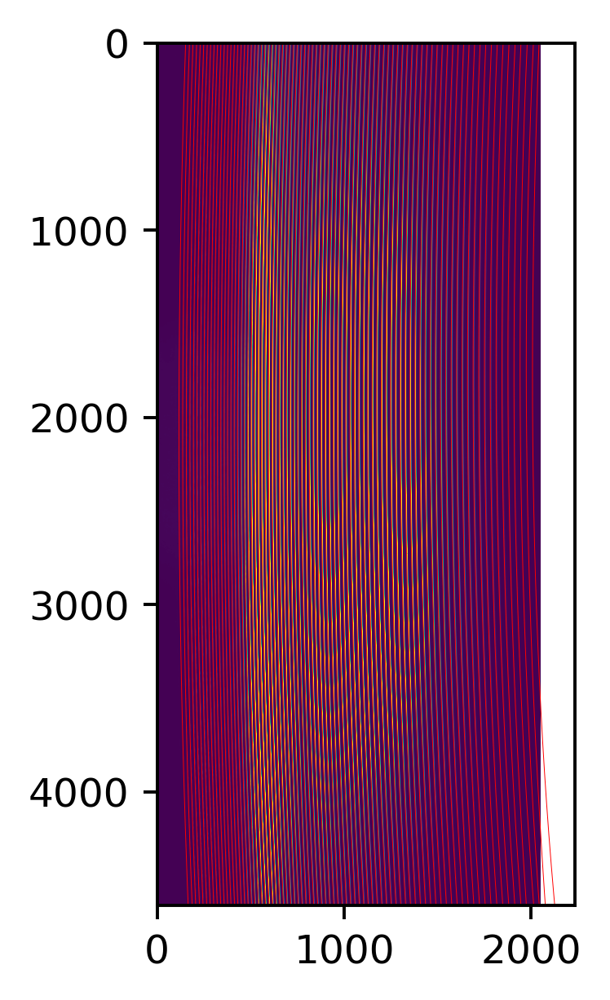

In [275]:
fig1 = plt.figure(dpi=350)
ax1 = fig1.gca()
ax1.imshow(newtrace, vmin=np.percentile(newtrace,5), vmax=np.percentile(newtrace,95))

newx = np.arange(newtrace.shape[0])
for aper, aperloc in aperset.items():
    newy = aperloc.position(newx)
    ax1.plot(newy, newx, lw=0.2, c='r')
plt.show()

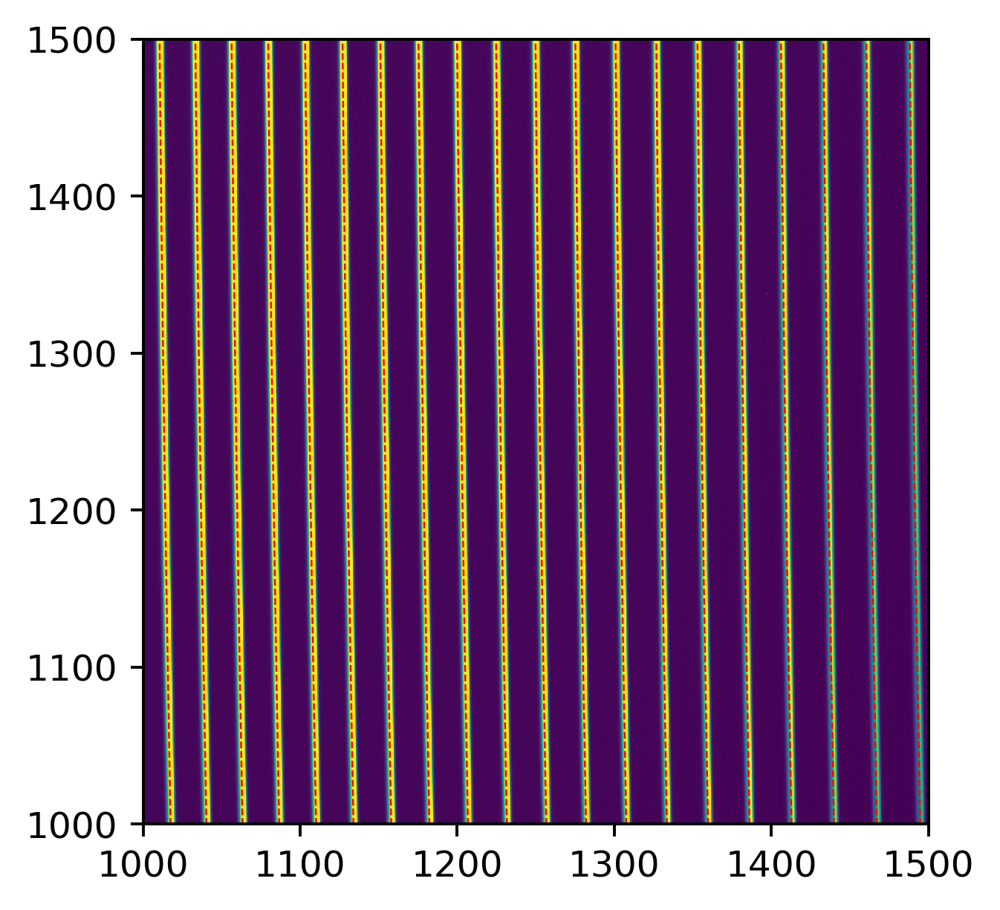

In [279]:
fig1 = plt.figure(dpi=350)
ax1 = fig1.gca()
ax1.imshow(newtrace, vmin=np.percentile(newtrace,5), vmax=np.percentile(newtrace,95))

newx = np.arange(newtrace.shape[0])
for aper, aperloc in aperset.items():
    newy = aperloc.position(newx)
    ax1.plot(newy, newx, lw=0.5, ls='--', c='r')
ax1.set_xlim(1000, 1500)
ax1.set_ylim(1000, 1500)
plt.show()

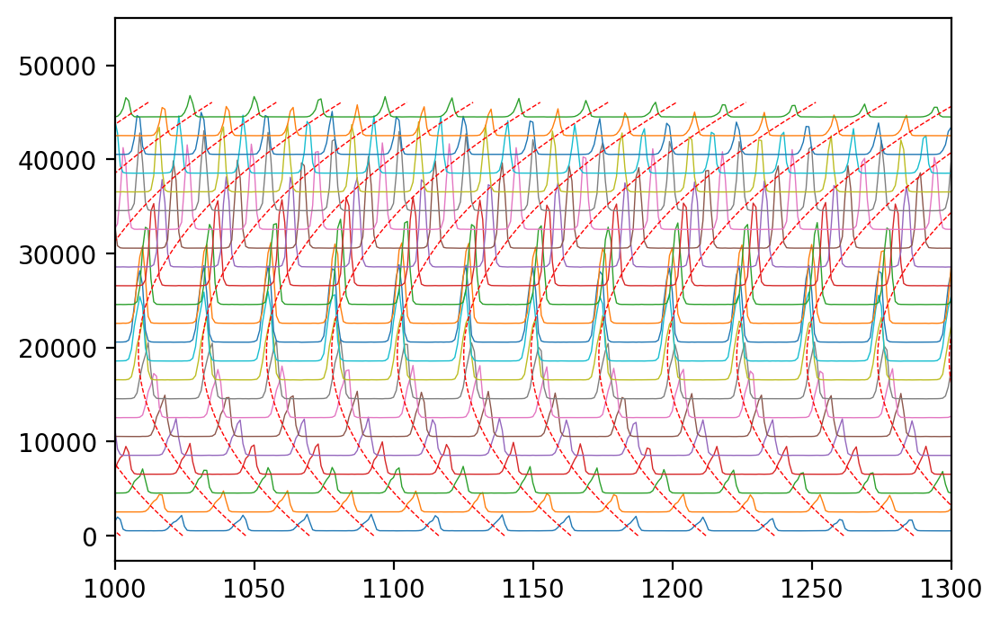

In [290]:
ny, nx = newtrace.shape

fig = plt.figure(dpi=200)
ax = fig.gca()

for i, y in enumerate(np.arange(50, ny, 200)):
    ax.plot(newtrace[y] + y*10, lw=0.5)
for aper, aperloc in aperset.items():
    newy = aperloc.position(newx)
    ax.plot(newy, newx*10, lw=0.5, ls='--', c='r')
ax.set_xlim(1000, 1300)
plt.show()

## PFS 数据

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt

rawpath = 'data/pfs/n64'
for fname in sorted(os.listdir(rawpath)):
    print(fname)

pfs1048.fits
pfs1052.fits
pfs1054.fits
pfs1055.fits
pfs1058.fits
pfs1059.fits
pfs1062.fits
pfs1063.fits
pfs1064.fits
pfs1068.fits
pfs1069.fits
pfs1072.fits
pfs1074.fits
pfs1075.fits
pfs1078.fits
pfs1079.fits
pfs1080.fits
pfs1081.fits
pfs1086.fits
pfs1087.fits
pfs1090.fits
pfs1091.fits
pfs1096.fits
pfs1097.fits
pfs1101.fits
pfs1106.fits
pfs1107.fits
pfs1110.fits
pfs1111.fits
pfs1117.fits
pfs1121.fits
pfs1126.fits
pfs1127.fits
pfs1130.fits
pfs1131.fits
pfs1137.fits
pfs1140.fits
pfs1146.fits
pfs1147.fits
pfs1150.fits
pfs1151.fits
pfs1156.fits
pfs1160.fits
pfs1166.fits
pfs1167.fits
pfs1170.fits
pfs1171.fits
pfs1176.fits
pfs1183.fits
pfs1184.fits
pfs1185.fits
pfs1188.fits
pfs1189.fits
pfs1192.fits
pfs1193.fits
pfs1194.fits
pfs1195.fits
pfs1199.fits
pfs1202.fits
pfs1203.fits
pfs1204.fits
pfs1205.fits
pfs1208.fits
pfs1212.fits
pfs1213.fits
pfs1214.fits
pfs1215.fits
pfs1218.fits
pfs1219.fits
pfs1222.fits
pfs1223.fits
pfs1224.fits
pfs1228.fits
pfs1232.fits
pfs1234.fits
pfs1235.fits
pfs1238.fits

In [3]:
import astropy.io.fits as fits

rawpath = 'data/pfs/n64'
for fname in sorted(os.listdir(rawpath)):
    filename = os.path.join(rawpath, fname)
    head = fits.getheader(filename)

    obsdate = head['DATE-OBS']
    objname = head['OBJECT']
    binning = head['BINNING']
    exptime = head['EXPTIME']
    expmode = head['EXPMODE']
    rospeed = head['SPEED']
    slit    = head['SLITNAME']
    print(fname, '{:15s}'.format(objname), '{:8.1f}'.format(exptime), '{:8s}'.format(expmode), obsdate,
          '{:3s}'.format(binning), '{:10s}'.format(rospeed), '{:10s}'.format(slit))
    
print(head.cards)

pfs1048.fits WideFlat            50.0 Time     2022-11-07T20:03:12 1x2 Normal     0.7x3.9   
pfs1052.fits WideFlat            50.0 Time     2022-11-07T20:10:47 1x2 Normal     0.7x3.9   
pfs1054.fits WideFlat            50.0 Time     2022-11-07T20:14:34 1x2 Normal     0.7x3.9   
pfs1055.fits WideFlat            50.0 Time     2022-11-07T20:16:26 1x2 Normal     0.7x3.9   
pfs1058.fits WideFlat            50.0 Time     2022-11-07T20:22:07 1x2 Normal     0.7x3.9   
pfs1059.fits WideFlat            50.0 Time     2022-11-07T20:24:01 1x2 Normal     0.7x3.9   
pfs1062.fits WideFlat            50.0 Time     2022-11-07T20:29:41 1x2 Normal     0.7x3.9   
pfs1063.fits WideFlat            50.0 Time     2022-11-07T20:31:35 1x2 Normal     0.7x3.9   
pfs1064.fits WideFlat            50.0 Time     2022-11-07T20:33:29 1x2 Normal     0.7x3.9   
pfs1068.fits Bias                 0.0 Time     2022-11-07T20:42:10 1x2 Normal     0.3x2.5   
pfs1069.fits Bias                 0.0 Time     2022-11-07T20:43:13 1x2

### 生成观测日志文件

In [3]:
import os
import numpy as np
import astropy.io.fits as fits
from astropy.table import Table
import matplotlib.pyplot as plt

logtable = Table(dtype=[
    ('fileid', str),
    ('object', str),
    ('exptime', float),
    ('expmode', str),
    ('obsdate', str),
    ('speed',   str),
    ('binning', str),
    ('slitname', str),
])

rawpath = 'data/pfs/n64'

for fname in sorted(os.listdir(rawpath)):
    filename = os.path.join(rawpath, fname)
    head = fits.getheader(filename)
    
    fileid = fname[0:-5]

    obsdate = head['DATE-OBS']
    objname = head['OBJECT']
    binning = head['BINNING']
    exptime = head['EXPTIME']
    expmode = head['EXPMODE']
    rospeed = head['SPEED']
    slit    = head['SLITNAME']
    print(fname, '{:15s}'.format(objname), '{:8.1f}'.format(exptime), '{:8s}'.format(expmode), obsdate,
          '{:3s}'.format(binning), '{:10s}'.format(rospeed), '{:10s}'.format(slit))
    logtable.add_row((fileid, objname, exptime, expmode, obsdate, rospeed,  binning, slit))

    
logtable.write('pfs.txt', format='ascii.fixed_width_two_line', overwrite=True)
print(logtable)

pfs1048.fits WideFlat            50.0 Time     2022-11-07T20:03:12 1x2 Normal     0.7x3.9   
pfs1052.fits WideFlat            50.0 Time     2022-11-07T20:10:47 1x2 Normal     0.7x3.9   
pfs1054.fits WideFlat            50.0 Time     2022-11-07T20:14:34 1x2 Normal     0.7x3.9   
pfs1055.fits WideFlat            50.0 Time     2022-11-07T20:16:26 1x2 Normal     0.7x3.9   
pfs1058.fits WideFlat            50.0 Time     2022-11-07T20:22:07 1x2 Normal     0.7x3.9   
pfs1059.fits WideFlat            50.0 Time     2022-11-07T20:24:01 1x2 Normal     0.7x3.9   
pfs1062.fits WideFlat            50.0 Time     2022-11-07T20:29:41 1x2 Normal     0.7x3.9   
pfs1063.fits WideFlat            50.0 Time     2022-11-07T20:31:35 1x2 Normal     0.7x3.9   
pfs1064.fits WideFlat            50.0 Time     2022-11-07T20:33:29 1x2 Normal     0.7x3.9   
pfs1068.fits Bias                 0.0 Time     2022-11-07T20:42:10 1x2 Normal     0.3x2.5   
pfs1069.fits Bias                 0.0 Time     2022-11-07T20:43:13 1x2

### 查看原始数据和FITS头信息

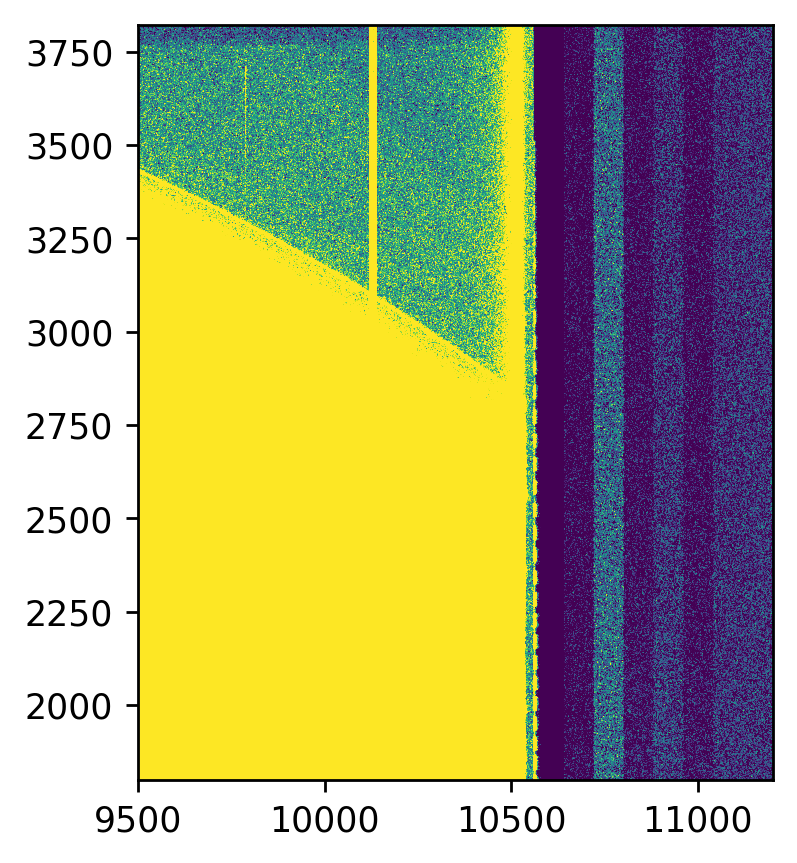

In [119]:
import astropy.io.fits as fits

rawpath = 'data/pfs/n64'
fname = 'pfs1064.fits'
filename = os.path.join(rawpath, fname)
data,head = fits.getdata(filename, header=True)

fig = plt.figure(dpi=250)
ax = fig.gca()
#ax.imshow(data), vmin=np.log(np.percentile(data, 5)), vmax=np.log(np.percentile(data, 10)))
ax.imshow(np.log(data), vmin=np.log(np.percentile(data, 5)), vmax=np.log(np.percentile(data, 10)))
#ax.axvline(10560, color='r', ls='--', lw=0.5)
#ax.axvline(11200-80, color='r', ls='--', lw=0.5)
#ax.set_xlim(5000,7000)
ax.set_xlim(9500,data.shape[1])
ax.set_ylim(1800, 3822)
plt.show()

In [120]:
print(head.cards)

('SIMPLE', True, '')
('BITPIX', 16, '')
('NAXIS', 2, '')
('NAXIS1', 11200, '')
('NAXIS2', 3822, '')
('BSCALE', 1.0, '')
('BZERO', 32768.0, '')
('BUNIT', 'DU/PIXEL', '')
('ORIGIN', 'LCO/OCIW', '')
('OBSERVER', 'PFSTeam', '')
('TELESCOP', 'Clay', '')
('SITENAME', 'LCO', '')
('SITEALT', 2405, 'meters')
('SITELAT', -29.01423, 'latitude')
('SITELONG', -70.69242, 'longitude')
('TIMEZONE', 3, '')
('DATE-OBS', '2022-11-07T20:33:29', '(start)')
('UT-DATE', '2022-11-07', 'UT date (start)')
('UT-TIME', '20:33:29', 'UT time (start) 74009 seconds')
('UT-END', '20:34:21', 'UT time (end) 74061 seconds')
('LC-TIME', '17:33:29', 'local time (start) 63209 seconds')
('NIGHT', '07Nov2022', 'local night')
('INSTRUME', 'PFS/STA', 'instrument name')
('SCALE', 0.057, 'arcsec/pixel')
('EGAIN', 2.3, 'electrons/DU')
('ENOISE', 3.1, 'electrons')
('RA', ' 18:57:18.2', 'right ascension')
('RA-D', 284.3259583, 'degrees')
('DEC', '-29:02:46.5', 'declination')
('DEC-D', -29.04625, 'degrees')
('EQUINOX', 2000.0, 'of ab

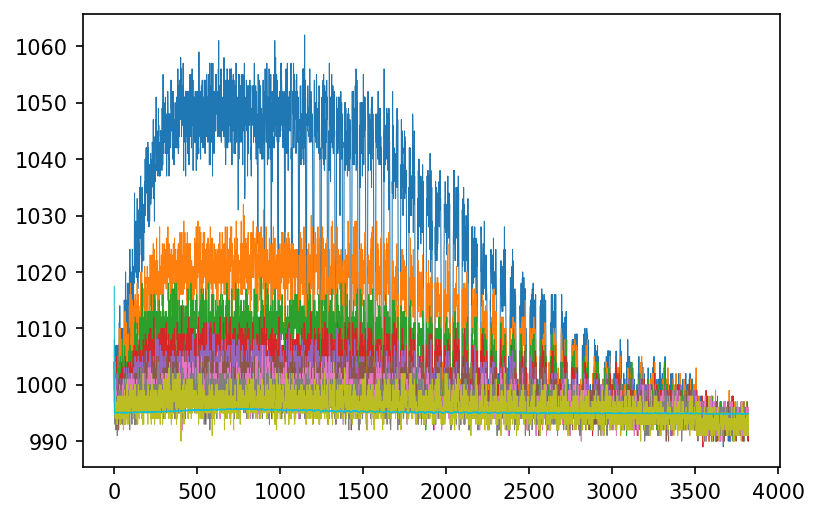

In [121]:
fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(data[:, 10560], lw=0.5)
ax.plot(data[:, 10561], lw=0.5)
ax.plot(data[:, 10562], lw=0.5)
ax.plot(data[:, 10563], lw=0.5)
ax.plot(data[:, 10564], lw=0.5)
ax.plot(data[:, 10565], lw=0.5)
ax.plot(data[:, 10566], lw=0.5)
ax.plot(data[:, 10567], lw=0.5)
ax.plot(data[:, 10568], lw=0.5)
ax.plot(data[:, 10560:11200].mean(axis=1), lw=0.5)
#ax.set_ylim(994, 996)
plt.show()

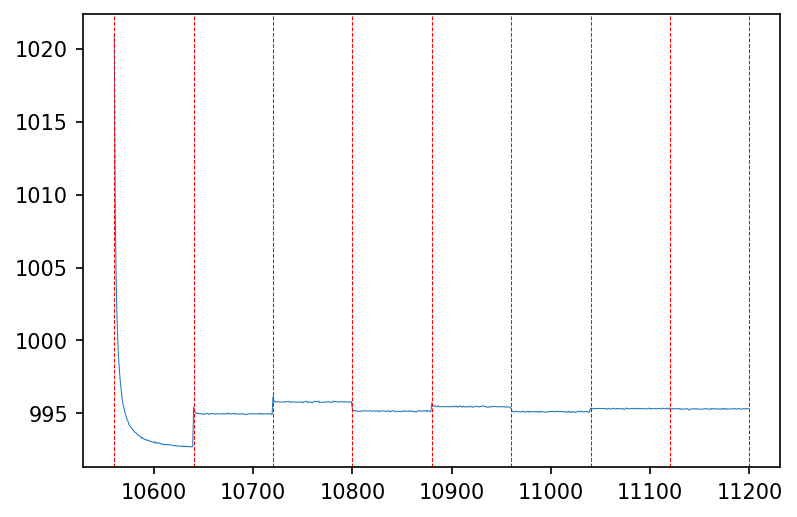

In [125]:
fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(np.arange(10560, 11200), data[:, 10560:11200].mean(axis=0), lw=0.5)
for i in np.arange(10560, 11200+1, 80):
    ax.axvline(i, color='r', lw=0.5, ls='--')
#ax.set_ylim(994, 996)
plt.show()

### Overscan 改正

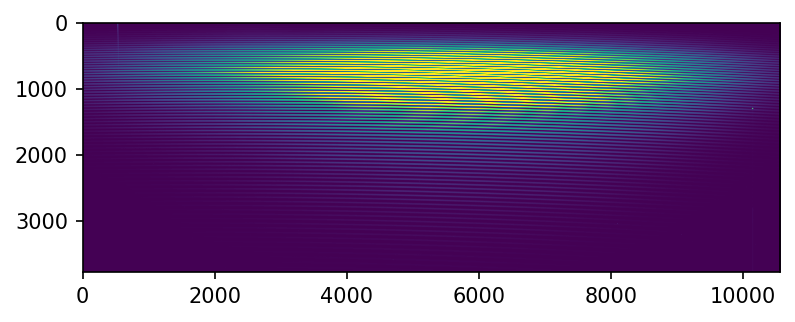

In [8]:
import astropy.io.fits as fits

rawpath = 'data/pfs/n64'
fname = 'pfs1090.fits'
filename = os.path.join(rawpath, fname)
data,head = fits.getdata(filename, header=True)

newdata = data[0:3782, 0:10560] - data[0:3782, 10560+80:].mean(axis=1).reshape(-1,1)
fig = plt.figure(dpi=150)
ax = fig.gca()
ax.imshow(newdata, vmin=np.percentile(newdata,5), vmax=np.percentile(newdata,95))
plt.show()

### 叠加 Narrow Flat

In [30]:
def combine_images(data_lst):
    nz, ny, nx = data_lst.shape
    mask = (np.mgrid[0:nz, 0:ny, 0:nx][0] == data_lst.argmax(axis=0))
    for i in range(5):
        mdata = np.ma.masked_array(data_lst, mask=mask)
        mean = mdata.mean(axis=0).data
        std  = mdata.std(axis=0).data
        newmask = data_lst > mean + 5*std
        if mask.sum()==newmask.sum():
            break
        mask = newmask
    return np.ma.masked_array(data_lst, mask=newmask).mean(axis=0).data

In [31]:
print(logtable)

 fileid  object  exptime expmode       obsdate       speed  binning slitname
------- -------- ------- ------- ------------------- ------ ------- --------
pfs1048 WideFlat    50.0    Time 2022-11-07T20:03:12 Normal     1x2  0.7x3.9
pfs1052 WideFlat    50.0    Time 2022-11-07T20:10:47 Normal     1x2  0.7x3.9
pfs1054 WideFlat    50.0    Time 2022-11-07T20:14:34 Normal     1x2  0.7x3.9
pfs1055 WideFlat    50.0    Time 2022-11-07T20:16:26 Normal     1x2  0.7x3.9
pfs1058 WideFlat    50.0    Time 2022-11-07T20:22:07 Normal     1x2  0.7x3.9
pfs1059 WideFlat    50.0    Time 2022-11-07T20:24:01 Normal     1x2  0.7x3.9
    ...      ...     ...     ...                 ...    ...     ...      ...
pfs1255 WideFlat    50.0    Time 2022-11-08T10:23:37 Normal     1x2  0.7x3.9
pfs1258 WideFlat    50.0    Time 2022-11-08T10:29:18 Normal     1x2  0.7x3.9
pfs1259 WideFlat    50.0    Time 2022-11-08T10:31:12 Normal     1x2  0.7x3.9
pfs1262 WideFlat    50.0    Time 2022-11-08T10:36:53 Normal     1x2  0.7x3.9

(11, 3782, 10560)


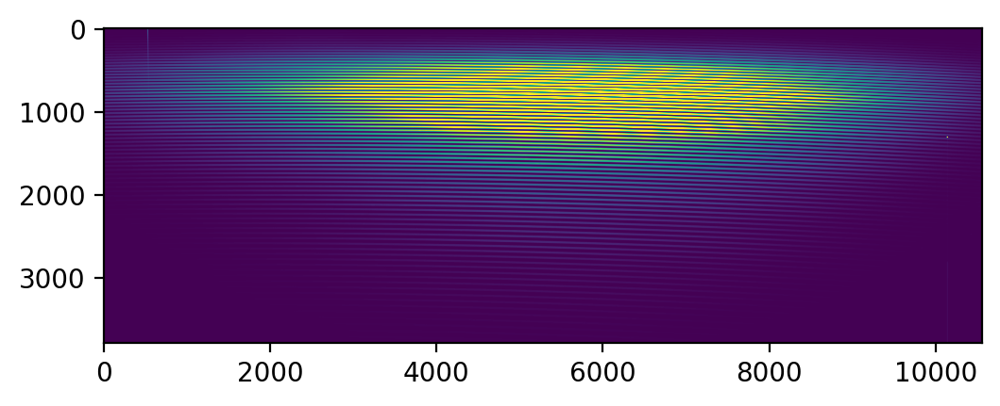

In [32]:
rawpath = 'data/pfs/n64'
data_lst = []
for item in logtable:
    if item['object']=='NarrowFlat':
        fname = '{}.fits'.format(item['fileid'])
        filename = os.path.join(rawpath, fname)
        data,head = fits.getdata(filename, header=True)
        newdata = data[0:3782, 0:10560] - data[0:3782, 10560+80:].mean(axis=1).reshape(-1,1)
        data_lst.append(newdata)

data_lst = np.array(data_lst)

print(data_lst.shape)

#trace = combine_images(data_lst)

trace = np.median(data_lst, axis=0)

fig = plt.figure(dpi=200)
ax = fig.gca()
ax.imshow(trace, vmin=np.percentile(trace,5), vmax=np.percentile(trace,95))
plt.show()

### 级次定位

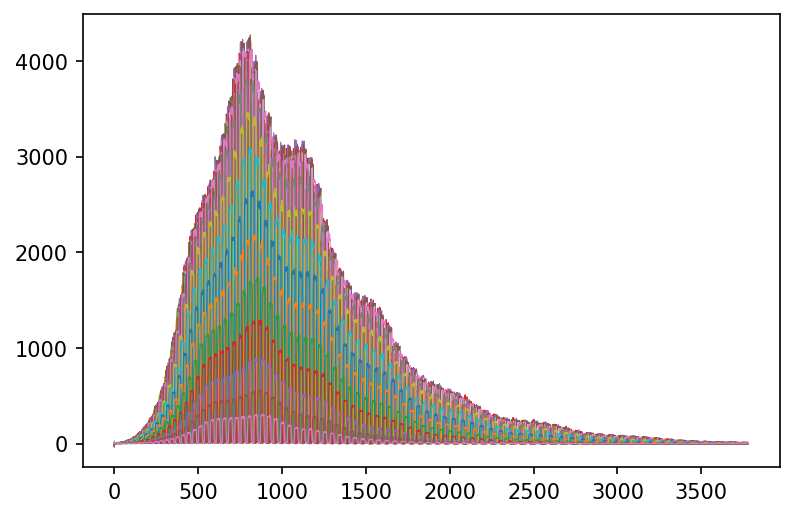

In [33]:
ny, nx = trace.shape

fig = plt.figure(dpi=150)
ax = fig.gca()
for i in np.arange(100, nx, 400):
    ax.plot(trace[:,i], lw=0.5)
plt.show()

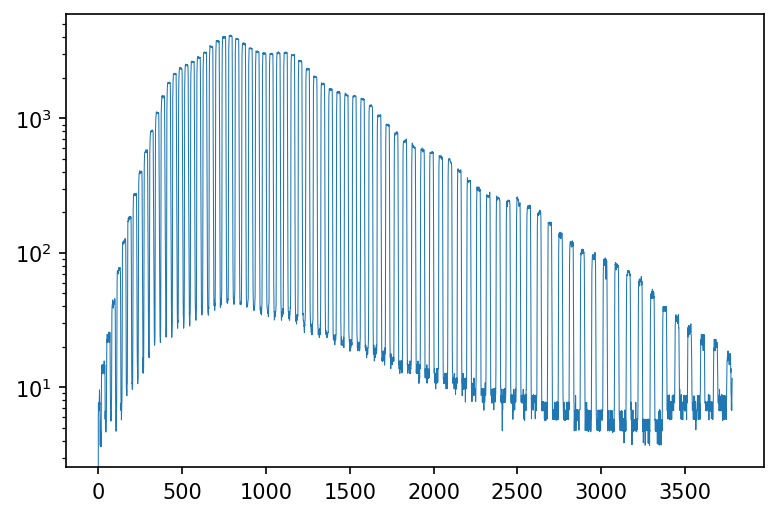

In [34]:
newflux = trace[:, nx//2]

fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(newflux, lw=0.5)
ax.set_yscale('log')
#ax.set_xlim(1500,2000)
plt.show()

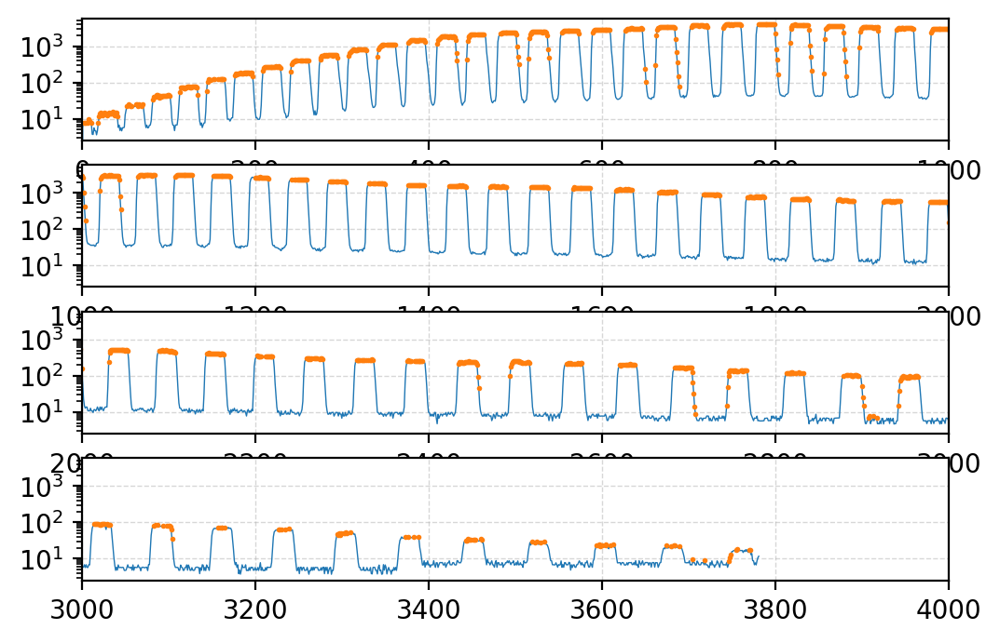

In [35]:
idx_lst = []
for i1 in np.arange(0, ny, 50):
    i2 = i1 + 50
    section = newflux[i1:i2]
    
    if i1 > 3000:
        percent = 90
    elif i1 > 2000:
        percent = 70
    elif i1 > 1000:
        percent = 60
    else:
        percent = 40
    
    mask = section > np.percentile(section, percent)
    idx = np.nonzero(mask)[0]
    for v in idx:
        idx_lst.append(v+i1)
    
fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
    ax.plot(newflux, lw=0.5)
    ax.plot(idx_lst, newflux[idx_lst], 'o', ms=1, lw=0)
    ax.set_xlim(i*1000, i*1000+1000)
    ax.set_yscale('log')
    ax.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.show()

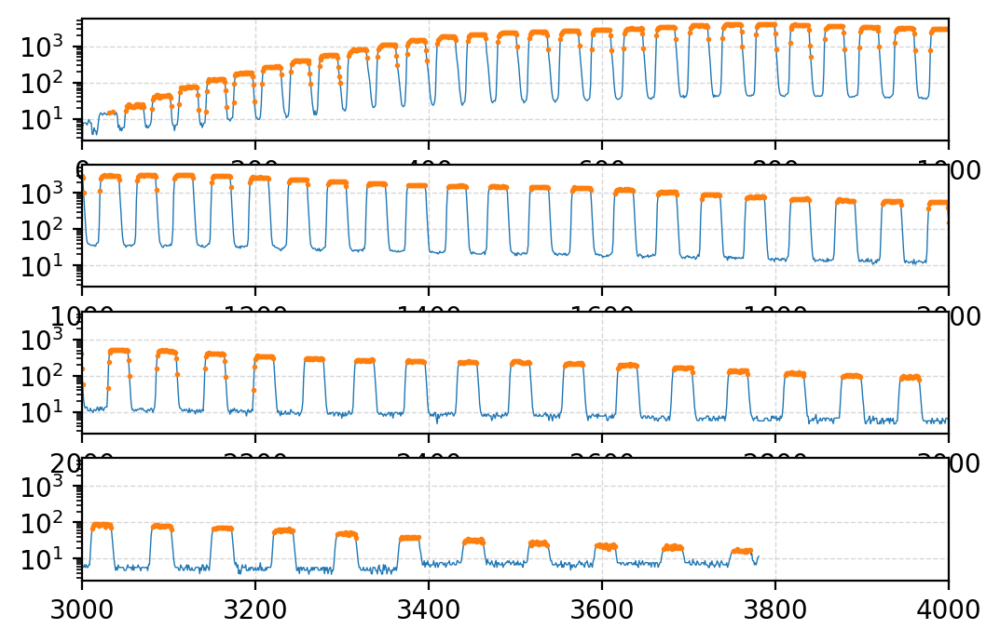

In [36]:
idx_lst = np.zeros(ny, dtype=bool)

for i1 in np.arange(0, ny, 100):
    i2 = i1 + 200
    section = newflux[i1:i2]
    
    if i1 > 3000:
        percent = 80
    elif i1 > 2000:
        percent = 70
    elif i1 > 1200:
        percent = 60
    elif i1 > 800:
        percent = 50
    else:
        percent = 40
    
    mask = section > np.percentile(section, percent)
    idx = np.nonzero(mask)[0]
    for v in idx:
        idx_lst[v+i1] = True
    
fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
    ax.plot(newflux, lw=0.5)
    ax.plot(np.arange(ny)[idx_lst], newflux[idx_lst], 'o', ms=1, lw=0)
    ax.set_xlim(i*1000, i*1000+1000)
    ax.set_yscale('log')
    ax.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.show()

In [37]:
idx = np.arange(ny)[idx_lst]
print(np.diff(idx))

[ 5 15  1 ...  1  2  1]


In [38]:
a = np.array([0, 47, 48, 49, 50, 97, 98, 99])

b = np.split(a, np.where(np.diff(a) > 3)[0]+1)
print(b)

[array([0]), array([47, 48, 49, 50]), array([97, 98, 99])]


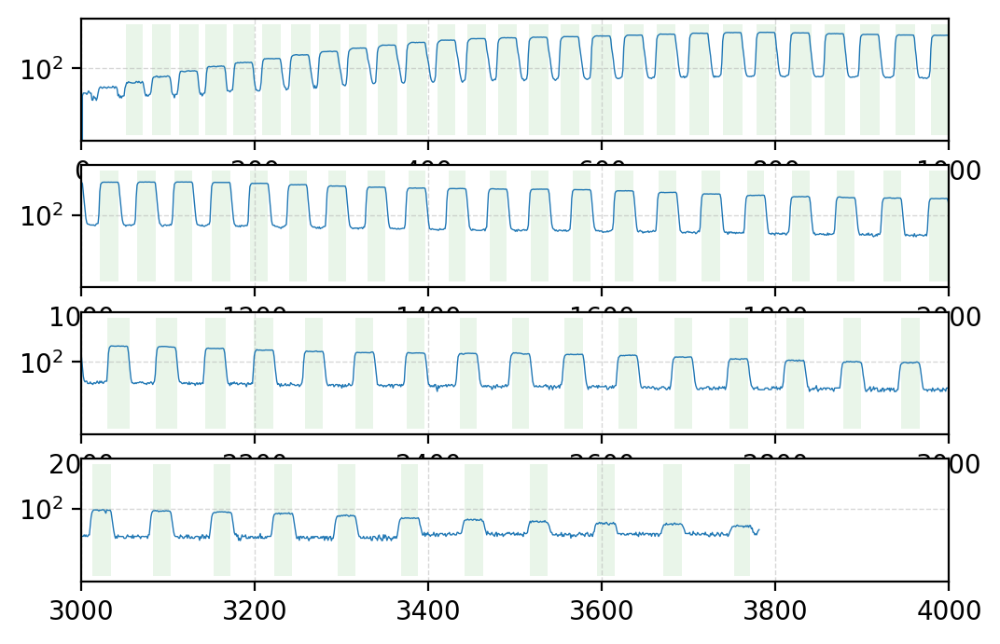

In [39]:
fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
    ax.plot(newflux, lw=0.5)
    #ax.plot(np.arange(ny)[idx_lst], newflux[idx_lst], 'o', ms=1, lw=0)
    
    for group in np.split(idx, np.where(np.diff(idx) > 3)[0]+1):
        i1, i2 = group[0], group[-1]
        if i*1000 < i1 < i*1000+1000:
            ax.fill_betweenx([0.1,1e4],i1,i2,color='C2', alpha=0.1, lw=0)
    ax.set_xlim(i*1000, i*1000+1000)
    ax.set_yscale('log')
    ax.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.show()

In [40]:
order_lst = []

for group in np.split(idx, np.where(np.diff(idx) > 3)[0]+1):
    if group[-1] - group[0] > 3:
        order_lst.append((group[0], group[-1]))
print(order_lst)

[(51, 71), (81, 103), (112, 135), (143, 167), (175, 199), (208, 230), (241, 264), (274, 298), (308, 329), (341, 364), (375, 398), (410, 431), (445, 466), (480, 502), (516, 538), (552, 574), (588, 611), (625, 648), (663, 685), (701, 723), (739, 762), (778, 801), (817, 841), (857, 880), (897, 920), (938, 961), (979, 1002), (1021, 1043), (1064, 1086), (1107, 1128), (1150, 1172), (1194, 1215), (1239, 1260), (1284, 1305), (1330, 1350), (1377, 1396), (1423, 1443), (1471, 1490), (1518, 1538), (1566, 1587), (1615, 1636), (1665, 1686), (1715, 1736), (1767, 1787), (1819, 1839), (1871, 1891), (1924, 1945), (1977, 2001), (2030, 2055), (2086, 2110), (2142, 2166), (2198, 2221), (2258, 2278), (2316, 2336), (2375, 2395), (2436, 2455), (2496, 2516), (2557, 2578), (2619, 2640), (2683, 2704), (2747, 2768), (2812, 2833), (2878, 2898), (2945, 2966), (3012, 3034), (3082, 3103), (3152, 3172), (3222, 3243), (3295, 3316), (3368, 3388), (3441, 3463), (3517, 3537), (3594, 3615), (3671, 3692), (3752, 3771)]


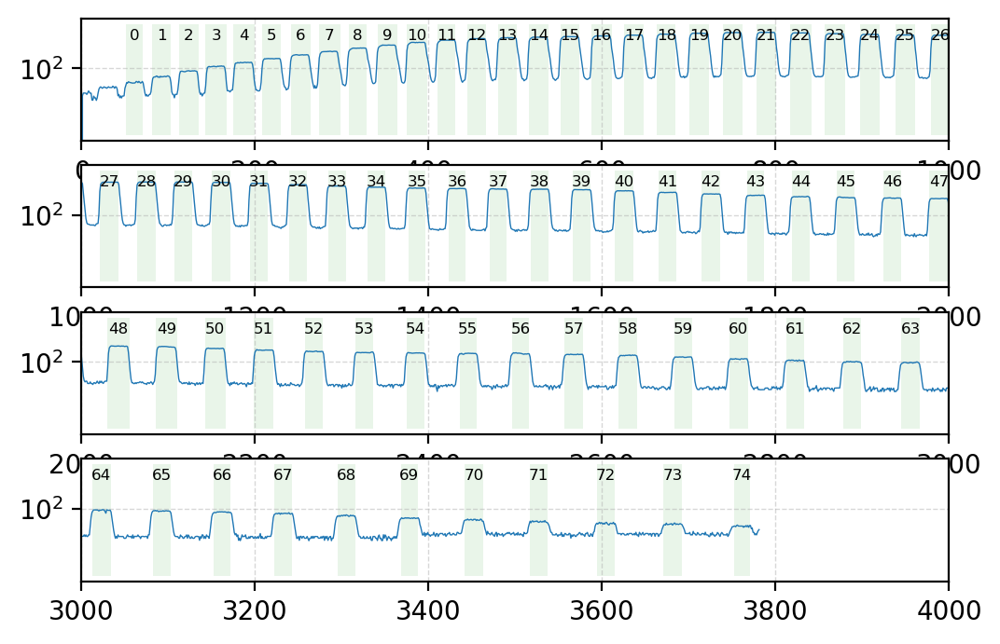

In [41]:
fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
    ax.plot(newflux, lw=0.5)
    
    for iorder, order in enumerate(order_lst):
        i1, i2 = order
        if i*1000 < i1 < i*1000+1000:
            ax.fill_betweenx([0.1,1e4],i1, i2,color='C2', alpha=0.1, lw=0)
            ax.text((i1+i2)/2, 2000, str(iorder), ha='center', fontsize=6)
    ax.set_xlim(i*1000, i*1000+1000)
    ax.set_yscale('log')
    ax.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.show()

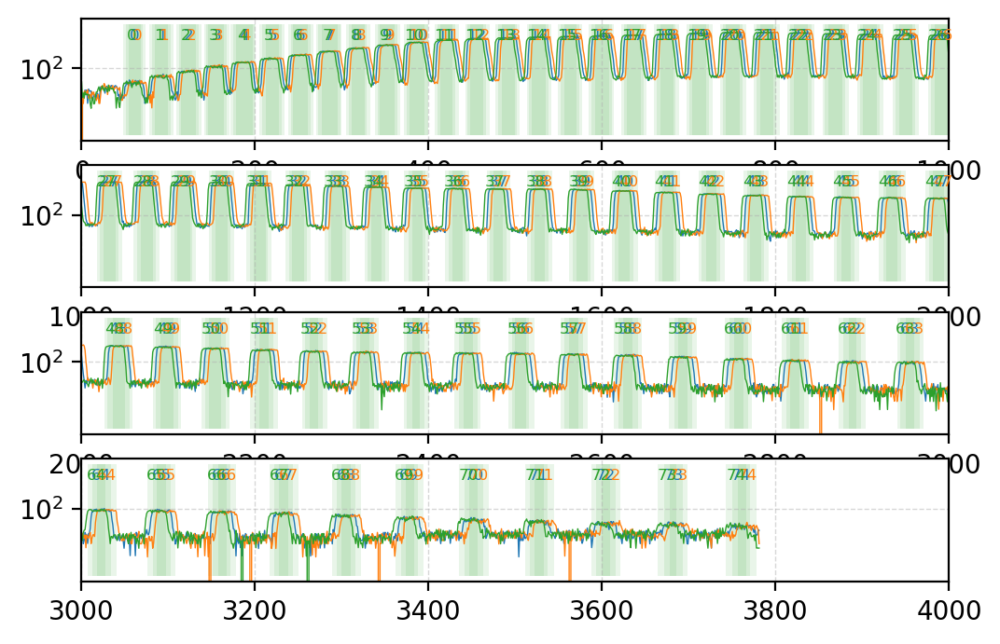

In [42]:

def get_orders(newflux):
    idx_lst = np.zeros(ny, dtype=bool)

    for i1 in np.arange(0, ny, 100):
        i2 = i1 + 200
        section = newflux[i1:i2]
    
        if i1 > 3000:
            percent = 80
        elif i1 > 2000:
            percent = 70
        elif i1 > 1200:
            percent = 60
        elif i1 > 800:
            percent = 50
        else:
            percent = 40
    
        mask = section > np.percentile(section, percent)
        idx = np.nonzero(mask)[0]
        for v in idx:
            idx_lst[v+i1] = True

    idx = np.arange(ny)[idx_lst]
    order_lst = []

    for group in np.split(idx, np.where(np.diff(idx) > 3)[0]+1):
        if group[-1] - group[0] > 5:
            i1, i2 = group[0], group[-1]
            f = newflux[i1:i2].mean()
            order_lst.append((i1, i2, f))
    return order_lst

fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
        
for ix, x in enumerate([nx//2, nx//2+200, nx//2-200]):
    newflux = newdata[:, x]
    order_lst = get_orders(newflux)
    for i in range(4):
        ax = fig.get_axes()[i]
        ax.plot(newflux, lw=0.5, c='C{}'.format(ix))
        for iorder, order in enumerate(order_lst):
            i1, i2, w = order
            if i*1000 < i1 < i*1000+1000:
                ax.fill_betweenx([0.1,1e4],i1, i2,color='C2', alpha=0.1, lw=0)
                ax.text((i1+i2)/2, 2000, str(iorder), ha='center', fontsize=6, color='C{}'.format(ix))
        ax.set_xlim(i*1000, i*1000+1000)
        ax.set_yscale('log')
        ax.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.show()

In [43]:
mainorder_lst = get_orders(newdata[:, nx//2])

In [44]:
for x in np.arange(nx//2, nx, 200):
    newflux = newdata[:, x]
    order_lst = get_orders(newflux)

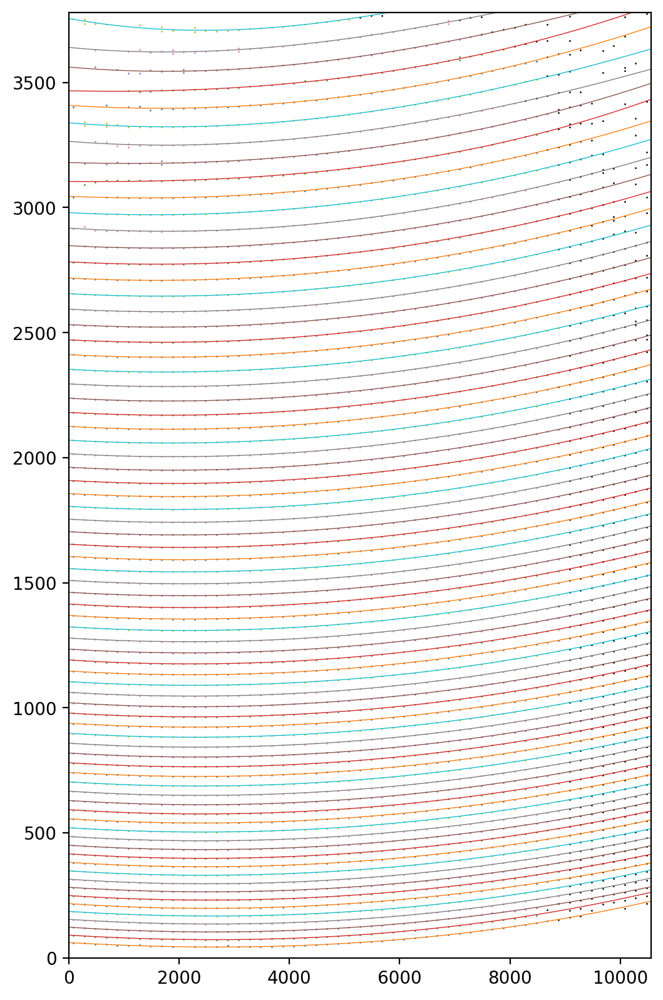

In [45]:
import scipy.optimize as opt

orderx_lst = {}
ordery_lst = {}
orderw_lst = {}
for io, (i1, i2, f) in enumerate(mainorder_lst):
    orderx_lst[io] = [nx/2]
    ordery_lst[io] = [(i1+i2)/2]
    orderw_lst[io] = [f]

#######################################

for x in np.arange(nx//2+200, nx, 200):
    newflux = newdata[:, x-2:x+3].mean(axis=1)
    order_lst = get_orders(newflux)
    
    lastylst = {o: ylst[-1] for o, ylst in sorted(ordery_lst.items())}
    distmin_lst = []
    for order in order_lst:
        c = (order[0] + order[1])/2
        dist_lst = [c-y for o, y in sorted(lastylst.items())]
        argmin = np.abs(dist_lst).argmin()
        distmin_lst.append(dist_lst[argmin])
    shift = np.median(distmin_lst)
    
    for order in order_lst:
        c = (order[0] + order[1])/2
        f = order[2]
        dist_lst = [abs(c - shift - y) for o, y in sorted(lastylst.items())]
        
        i = np.argmin(dist_lst)
        if dist_lst[i] < 15:
            orderx_lst[i].append(x)
            ordery_lst[i].append(c)
            orderw_lst[i].append(f)

#######################################
for ix, x in enumerate(np.arange(nx//2-200, 0, -200)):
    newflux = newdata[:, x-2:x+3].mean(axis=1)
    order_lst = get_orders(newflux)
    
    if ix == 0:
        lastylst = {o: ylst[0] for o, ylst in sorted(ordery_lst.items())}
    else:
        lastylst = {o: ylst[-1] for o, ylst in sorted(ordery_lst.items())}
        
    distmin_lst = []
    for order in order_lst:
        c = (order[0] + order[1])/2
        dist_lst = [abs(c - y) for o, y in sorted(lastylst.items())]
        argmin = np.abs(dist_lst).argmin()
        distmin_lst.append(dist_lst[argmin])
    shift = np.median(distmin_lst)
    
    for order in order_lst:
        c = (order[0] + order[1])/2
        f = order[2]
        dist_lst = [abs(c - shift - y) for o, y in sorted(lastylst.items())]
        i = np.argmin(dist_lst)
        if dist_lst[i] < 15:
            orderx_lst[i].append(x)
            ordery_lst[i].append(c)
            orderw_lst[i].append(f)


fig = plt.figure(dpi=200, figsize=(6, 10))
ax = fig.gca()

master_order_lst = {}
ny, nx = trace.shape
for o in orderx_lst.keys():
    xdata = np.array(orderx_lst[o])
    ydata = np.array(ordery_lst[o])
    wdata = np.array(orderw_lst[o])
    
    arg = np.argsort(xdata)
    xdata = xdata[arg]
    ydata = ydata[arg]
    wdata = ydata[arg]
    
    #ax.plot(xdata, ydata, 'o-', ms=2, lw=0.5)
    
    fitfunc = lambda p, x: p[0]*x**3 + p[1]*x**2 + p[2]*x + p[3]
    errfunc = lambda p, x, y, w:  w*(y - fitfunc(p,x))
    
    mask = np.ones_like(xdata, dtype=bool)
    for i in range(3):
        fitres = opt.least_squares(errfunc, [0, 0, 0, ydata[mask].mean()], args=(xdata[mask]/10000, ydata[mask], wdata[mask]))
        p = fitres['x']
        res_lst = ydata - fitfunc(p, xdata)
        std = res_lst[mask].std()
        newmask = np.abs(res_lst) < 3*std
        mask = newmask
    
    ax.plot(xdata[mask], ydata[mask], 'o', ms=1, lw=0.5, mew=0)
    ax.plot(xdata[~mask], ydata[~mask], 'o', ms=1, lw=0.5, mew=0, c='k')
        
    #c = np.polyfit(xdata/10000, ydata, deg=3)
    #newx = np.linspace(xdata[mask][0], xdata[mask][-1], 100)
    newx = np.arange(nx)
    #newy = np.polyval(c, newx/10000)
    newy = fitfunc(p, newx/10000)
    ax.plot(newx, newy, lw=0.5)
    ax.set_xlim(0, nx-1)
    ax.set_ylim(0, ny-1)
    
    master_order_lst[o] = newy

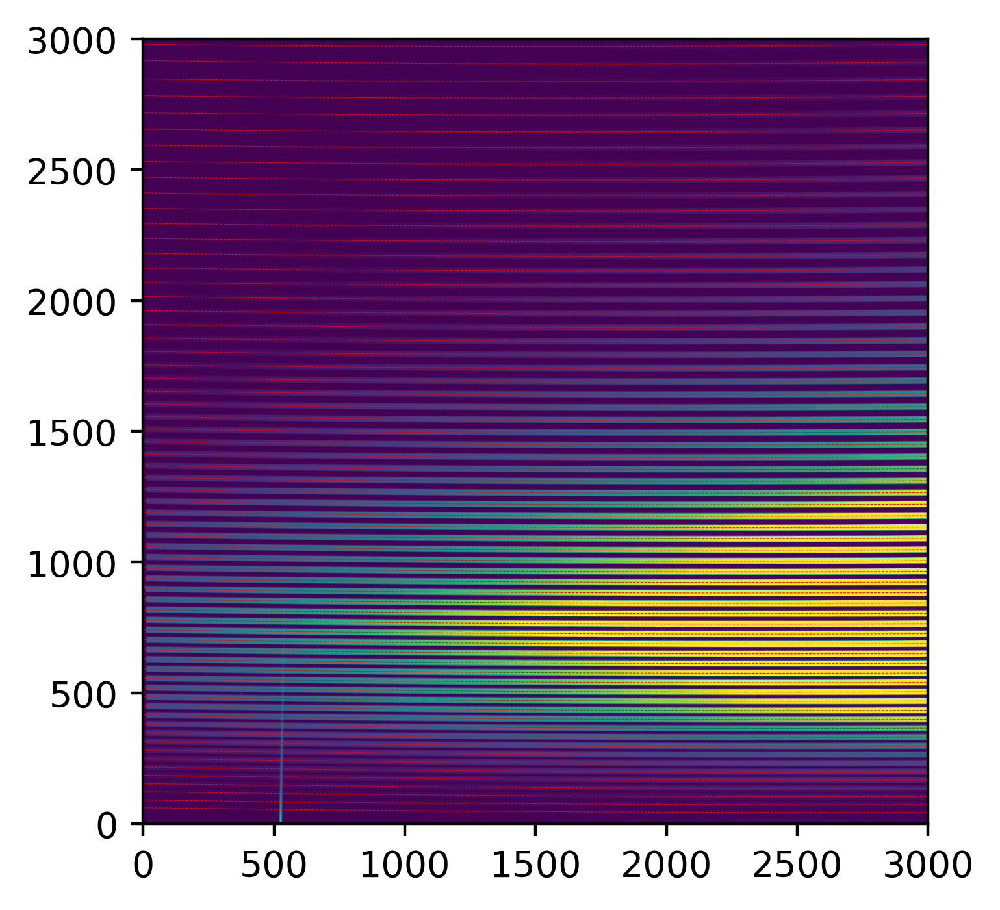

In [47]:
fig = plt.figure(dpi=400)
ax = fig.gca()
ax.imshow(trace, vmin=np.percentile(trace,5), vmax=np.percentile(trace, 90))
for o, ylst in master_order_lst.items():
    ax.plot(ylst, 'r--', lw=0.2)
ax.set_xlim(0, 3000)
ax.set_ylim(0, 3000)
plt.show()

### 平场改正

In [48]:
dumpdata = []

for o, ypos in sorted(master_order_lst.items()):
    dumpdata.append(ypos)
    
dumpdata = np.array(dumpdata)
hdulst = fits.HDUList([fits.PrimaryHDU(data=dumpdata)])
hdulst.writeto('orderpos.fits', overwrite=True)

In [49]:
print(logtable)

 fileid  object  exptime expmode       obsdate       speed  binning slitname
------- -------- ------- ------- ------------------- ------ ------- --------
pfs1048 WideFlat    50.0    Time 2022-11-07T20:03:12 Normal     1x2  0.7x3.9
pfs1052 WideFlat    50.0    Time 2022-11-07T20:10:47 Normal     1x2  0.7x3.9
pfs1054 WideFlat    50.0    Time 2022-11-07T20:14:34 Normal     1x2  0.7x3.9
pfs1055 WideFlat    50.0    Time 2022-11-07T20:16:26 Normal     1x2  0.7x3.9
pfs1058 WideFlat    50.0    Time 2022-11-07T20:22:07 Normal     1x2  0.7x3.9
pfs1059 WideFlat    50.0    Time 2022-11-07T20:24:01 Normal     1x2  0.7x3.9
    ...      ...     ...     ...                 ...    ...     ...      ...
pfs1255 WideFlat    50.0    Time 2022-11-08T10:23:37 Normal     1x2  0.7x3.9
pfs1258 WideFlat    50.0    Time 2022-11-08T10:29:18 Normal     1x2  0.7x3.9
pfs1259 WideFlat    50.0    Time 2022-11-08T10:31:12 Normal     1x2  0.7x3.9
pfs1262 WideFlat    50.0    Time 2022-11-08T10:36:53 Normal     1x2  0.7x3.9

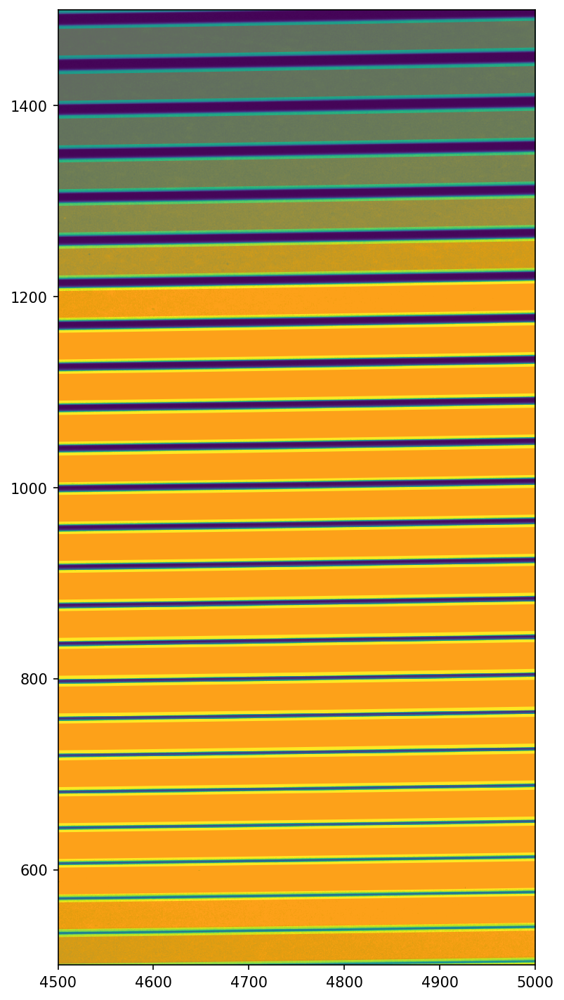

In [216]:
filename = os.path.join(rawpath, 'pfs1048.fits')
data = fits.getdata(filename)
data = data[0:3782, 0:10560] - data[0:3782, 10560+80:].mean(axis=1).reshape(-1,1)
ny, nx = data.shape

fig = plt.figure(figsize=(6,12),dpi=150)
ax = fig.gca()
ax.imshow(data, vmin=np.percentile(data, 5), vmax=np.percentile(data, 95))
for o, ylst in sorted(master_order_lst.items()):
    #ax.plot(ylst, 'r-', lw=0.5)
    #ax.plot(ylst+14, 'r--', lw=0.5)
    #ax.plot(ylst-14, 'r--', lw=0.5)
    ax.fill_between(np.arange(nx), ylst+14, ylst-14, color='r', lw=0, alpha=0.3)
ax.set_xlim(4500,5000)
ax.set_ylim(500, 1500)
plt.show()

In [217]:

ny, nx = data.shape
yy, xx = np.mgrid[:ny:, :nx:]
print(data.shape, yy.shape,xx.shape)
print(data)
print(yy)
print(xx)

(3782, 10560) (3782, 10560) (3782, 10560)
[[-36.81071429 -34.81071429 -37.81071429 ...  16.18928571  16.18928571
   16.18928571]
 [ -4.74821429  -3.74821429  -3.74821429 ...   1.25178571   0.25178571
    2.25178571]
 [ -4.03035714  -4.03035714  -5.03035714 ...   0.96964286   0.96964286
    1.96964286]
 ...
 [ -3.06071429  -3.06071429  -3.06071429 ...   1.93928571   1.93928571
   -1.06071429]
 [ -3.05892857  -3.05892857  -1.05892857 ...   2.94107143  -1.05892857
    1.94107143]
 [ -4.00357143  -2.00357143  -2.00357143 ...   0.99642857   2.99642857
    4.99642857]]
[[   0    0    0 ...    0    0    0]
 [   1    1    1 ...    1    1    1]
 [   2    2    2 ...    2    2    2]
 ...
 [3779 3779 3779 ... 3779 3779 3779]
 [3780 3780 3780 ... 3780 3780 3780]
 [3781 3781 3781 ... 3781 3781 3781]]
[[    0     1     2 ... 10557 10558 10559]
 [    0     1     2 ... 10557 10558 10559]
 [    0     1     2 ... 10557 10558 10559]
 ...
 [    0     1     2 ... 10557 10558 10559]
 [    0     1     2 ... 1

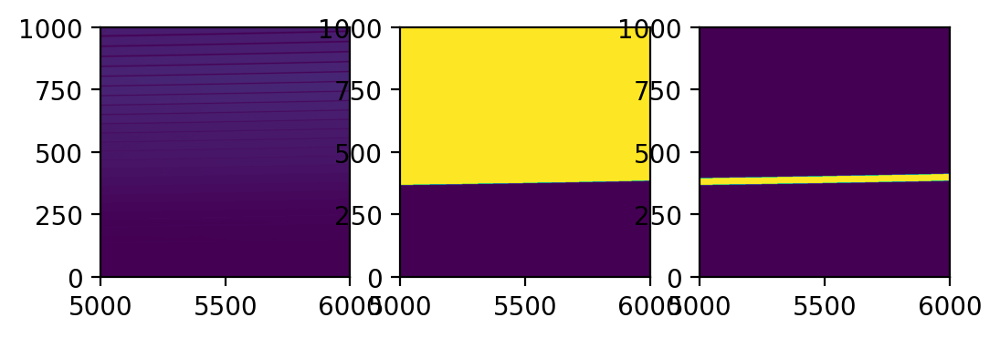

In [218]:
order = 10
mask1 = yy > master_order_lst[order]-14
mask2 = yy < master_order_lst[order]+14
mask = mask1*mask2

flux = (data*mask).mean(axis=0)

fig = plt.figure(dpi=200)
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
ax1.imshow(data)
ax2.imshow(mask1)
ax3.imshow(mask)
for ax in fig.get_axes():
    ax.set_xlim(5000, 6000)
    ax.set_ylim(0, 1000)

[-3.12308514e-26  1.14588452e-21 -1.49015126e-17  8.47431485e-14
 -2.78254392e-10  8.13920488e-07  8.08854496e-04  1.59444281e+00]


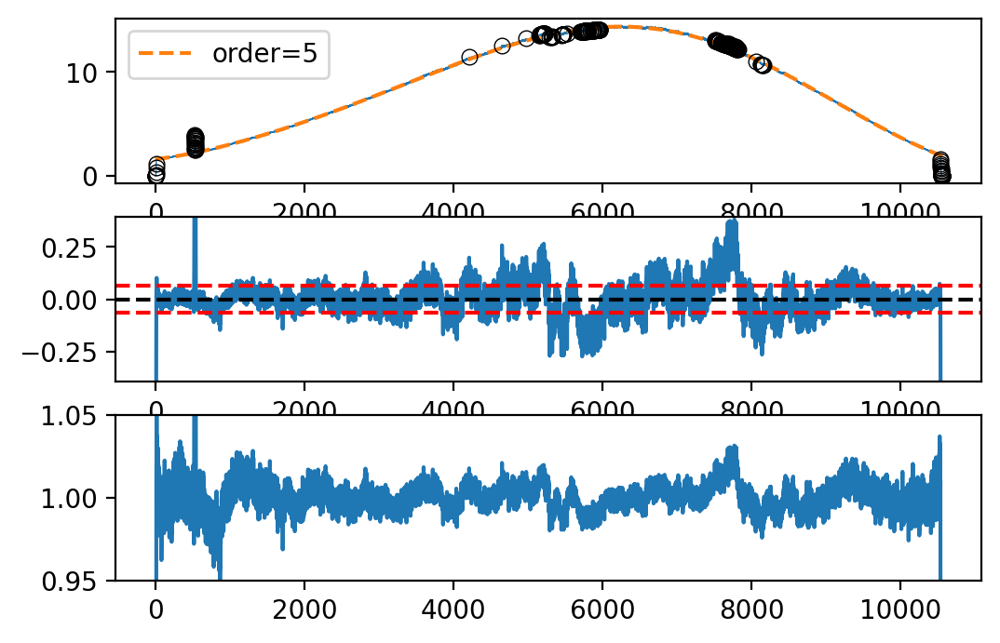

In [220]:
order = 10
mask1 = yy > master_order_lst[order]-14
mask2 = yy < master_order_lst[order]+14
mask = mask1*mask2

flux = (data*mask).sum(axis=0)/28

fig = plt.figure(dpi=200)
ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)
ax.plot(flux, lw=0.5)


allx = np.arange(nx)

m = np.ones_like(allx, dtype=bool)
m[0:20] = False
m[-30:] = False



for i in range(5):
    coeff = np.polyfit(allx[m], flux[m], deg=7)
    yfit = np.polyval(coeff, allx)
    yres_lst = flux - yfit
    std = yres_lst[m].std()
    newm = np.abs(yres_lst) < 3*std
    m = newm

ax.plot(yfit, ls='--', label='order=5')
ax.plot(allx[~m],flux[~m], 'o', c='none', mec='k', mew=0.5)
#ax.set_xlim(nx-200, nx)

ax2.plot(flux - yfit)
ax2.axhline(std, color='r', ls='--')
ax2.axhline(-std, color='r', ls='--')
ax2.axhline(0, color='k', ls='--')
ax2.set_ylim(-6*std, 6*std)

ax.legend()


sens = flux/yfit
ax3.plot(sens)
ax3.set_ylim(0.95, 1.05)

print(coeff)

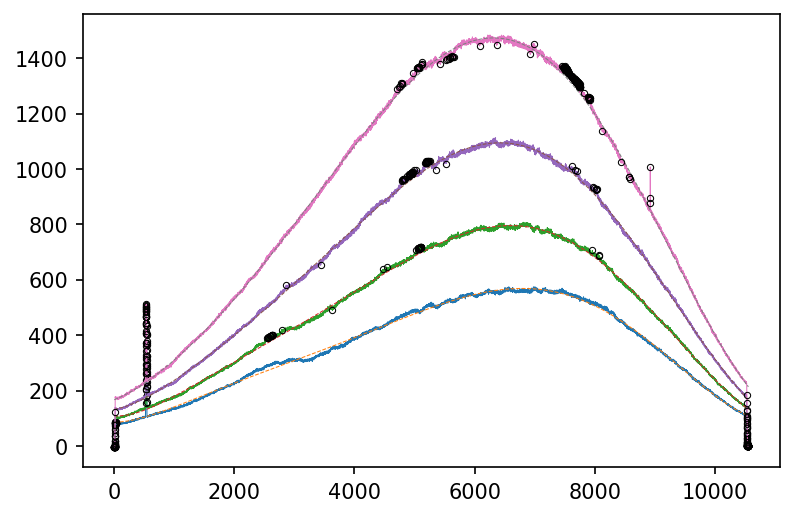

In [221]:
import time

sensmap = np.ones((ny, nx), dtype=np.float32)

fig = plt.figure(dpi=150)
ax = fig.gca()
spec_lst = {}
yy, xx = np.mgrid[:ny:, :nx:]
allx = np.arange(nx)
for o, ylst in sorted(master_order_lst.items()):
    t1 = time.time()
    mask = (yy < ylst+14)*(yy > ylst-14)
    flux = (data*mask).sum(axis=0)/28
    t2 = time.time()

    m = np.ones(nx,dtype=bool)
    m[0:30] = False
    m[-30:] = False
    for i in np.arange(4):
        c = np.polyfit(allx[m], flux[m], deg=7)
        y = np.polyval(c, allx)
        res_lst = flux - y
        std = res_lst[m].std()
        newm = np.abs(res_lst) < 3*std
        if newm.sum()==m.sum():
            break
        m = newm
    
    if 5<o<10:
        ax.plot(flux, ls='-',lw=0.5)
        ax.plot(allx, y, '--', lw=0.5)
        ax.plot(allx[~m], flux[~m], 'o', ms=3, c='none', mec='k', mew=0.5)
        #ax.imshow(mask)

    y2d = np.tile(y, ny).reshape(ny, nx)
    sensmap[mask] = (data/y2d)[mask]

    
plt.show()

sensmap[sensmap <= 0] = 1.0
#sensmap[sensmap > 10] = 1.0


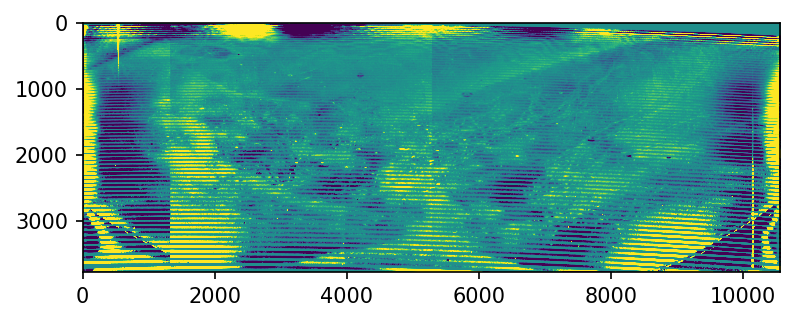

In [223]:
fig = plt.figure(dpi=150)
ax = fig.gca()
cax = ax.imshow(sensmap, vmin=0.95, vmax=1.05)

fits.writeto('sensmap.fits', sensmap, overwrite=True)

### 对科学目标做一个简单的抽谱

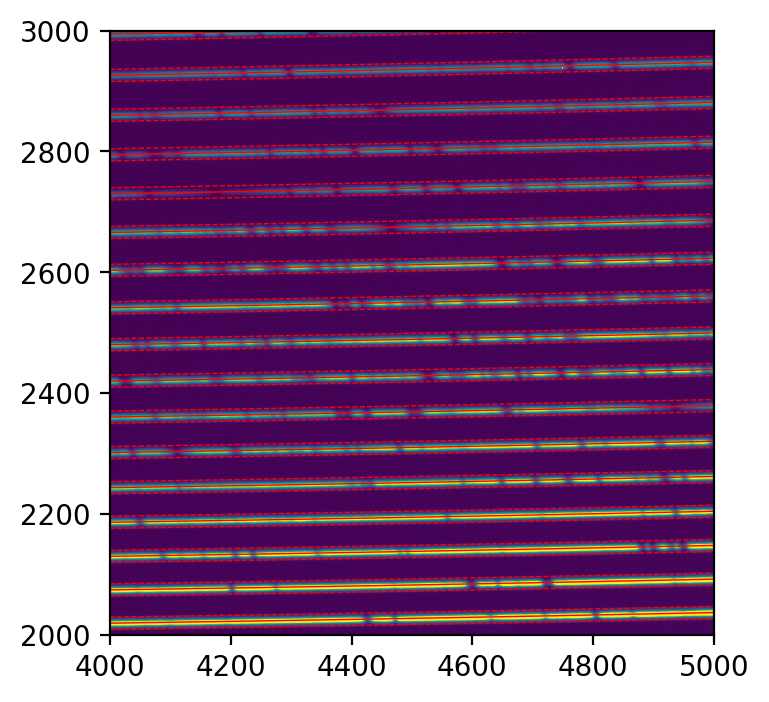

In [224]:
fname = 'pfs1146.fits'
filename = os.path.join(rawpath, fname)
sdata = fits.getdata(filename)
sdata = sdata[0:3782, 0:10560] - sdata[0:3782, 10560+80:].mean(axis=1).reshape(-1,1)

fig = plt.figure(dpi=200)
ax = fig.gca()
ax.imshow(sdata, vmin=np.percentile(sdata, 5), vmax=np.percentile(sdata, 95))
for o, ylst in sorted(master_order_lst.items()):
    ax.plot(ylst, 'r-', lw=0.5)
    ax.plot(ylst+10, 'r--', lw=0.5)
    ax.plot(ylst-10, 'r--', lw=0.5)
ax.set_xlim(4000, 5000)
ax.set_ylim(2000, 3000)
plt.show()

### 背景改正

(800.0, 1000.0)

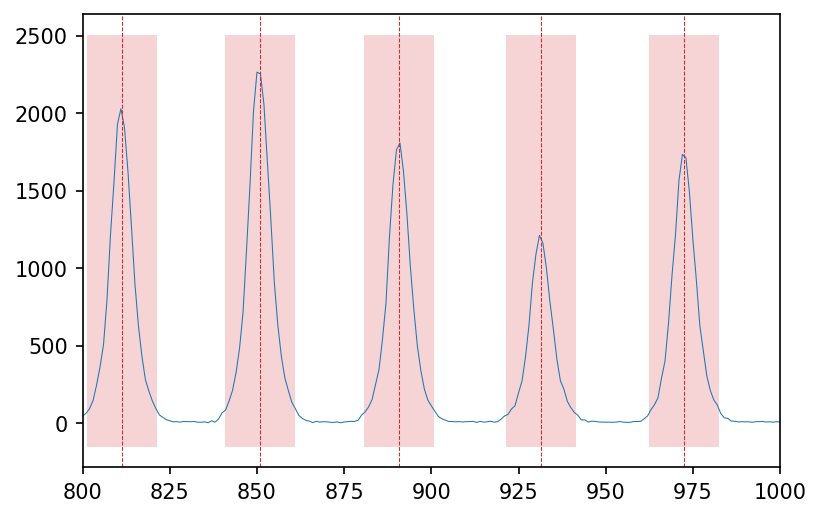

In [288]:
fig = plt.figure(dpi=150)
ax = fig.gca()

x = 4000
    
ax.plot(sdata[:,x], lw=0.5)
    
_y1, _y2 = ax.get_ylim()

for o, ylst in sorted(master_order_lst.items()):
    c = ylst[x]
    ax.axvline(c, color='C3', lw=0.5, ls='--')
    ax.fill_betweenx([_y1, _y2], c-10, c+10, color='C3', alpha=0.2, lw=0)
_y1, _y2 = ax.set_ylim()

ax.set_xlim(800, 1000)

1950


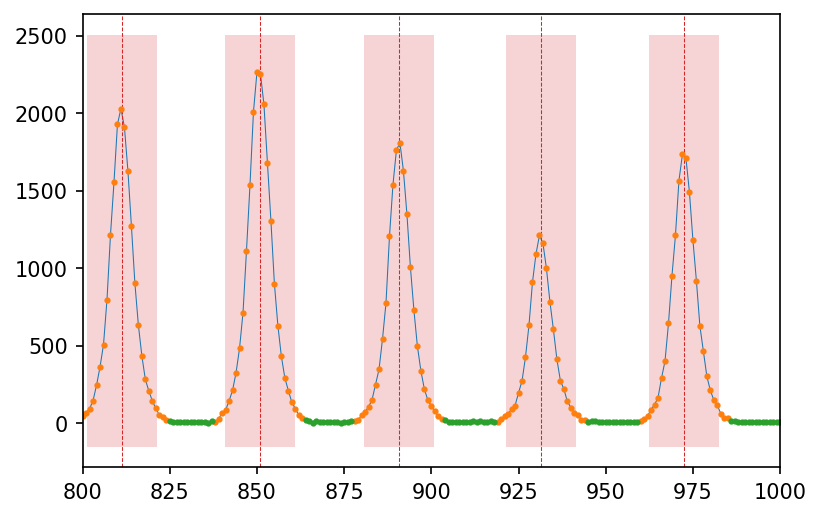

In [289]:
fig = plt.figure(dpi=150)
ax = fig.gca()

x = 4000
    
ax.plot(sdata[:,x], lw=0.5)
    
_y1, _y2 = ax.get_ylim()

for o, ylst in sorted(master_order_lst.items()):
    c = ylst[x]
    ax.axvline(c, color='C3', lw=0.5, ls='--')
    ax.fill_betweenx([_y1, _y2], c-10, c+10, color='C3', alpha=0.2, lw=0)
_y1, _y2 = ax.set_ylim()


mask = np.zeros(ny, dtype=bool)
for o, ylst in sorted(master_order_lst.items()):
    c = ylst[x]
    mask += (np.arange(ny) > c-13)*(np.arange(ny)< c+13)
print(mask.sum())
ax.plot(np.arange(ny)[mask], sdata[:,x][mask], 'o', lw=0.5, ms=2)

bkgmask = ~mask

ax.plot(np.arange(ny)[bkgmask], sdata[:,x][bkgmask], 'o', lw=0.5, ms=2)

ax.set_xlim(800, 1000)
plt.show()

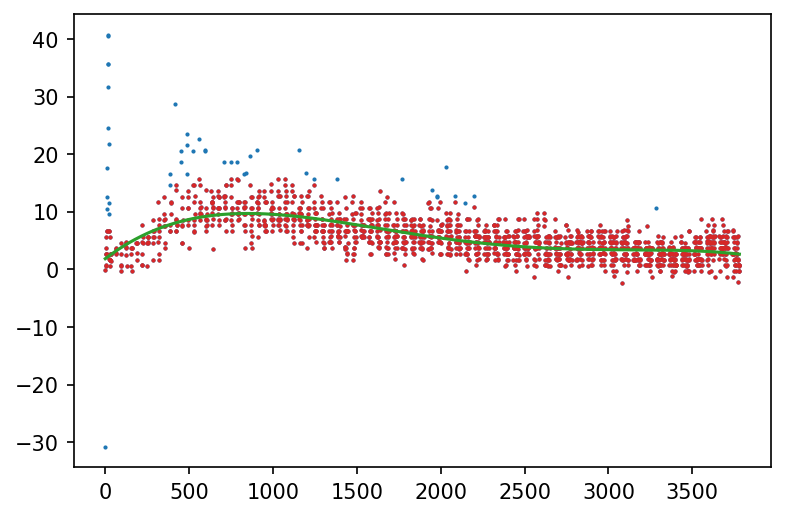

In [279]:
fig = plt.figure(dpi=150)
ax = fig.gca()

bkgx = np.arange(ny)[bkgmask]
bkgy = sdata[:,x][bkgmask]
ax.plot(bkgx, bkgy, 'o', lw=0.5, ms=1)

m = np.ones_like(bkgx,dtype=bool)
for i in np.arange(4):
    c = np.polyfit(bkgx[m], bkgy[m], deg=4)
    y = np.polyval(c, bkgx)
    res_lst = bkgy - y
    std = res_lst[m].std()
    newm = np.abs(res_lst) < 3*std
    if newm.sum()==m.sum():
        break
    m = newm


ax.plot(bkgx[m], bkgy[m], 'o', c='C3', ms=1)
ax.plot(np.arange(ny), np.polyval(c, np.arange(ny)), '-', c='C2')
#ax.set_xlim(800, 1000)
plt.show()

In [280]:
bkgdata = np.zeros_like(sdatanew)

for x in np.arange(nx):
    mask = np.zeros(ny, dtype=bool)
    for o, ylst in sorted(master_order_lst.items()):
        c = ylst[x]
        mask += (np.arange(ny) > c-13)*(np.arange(ny)< c+13)
        
    bkgmask = ~mask
    
    bkgx = np.arange(ny)[bkgmask]
    bkgy = sdata[:,x][bkgmask]

    m = np.ones_like(bkgx,dtype=bool)
    for i in np.arange(4):
        c = np.polyfit(bkgx[m], bkgy[m], deg=4)
        y = np.polyval(c, bkgx)
        res_lst = bkgy - y
        std = res_lst[m].std()
        newm = np.abs(res_lst) < 3*std
        if newm.sum()==m.sum():
            break
        m = newm
        
    bkgdata[:,x] = np.polyval(c, np.arange(ny))


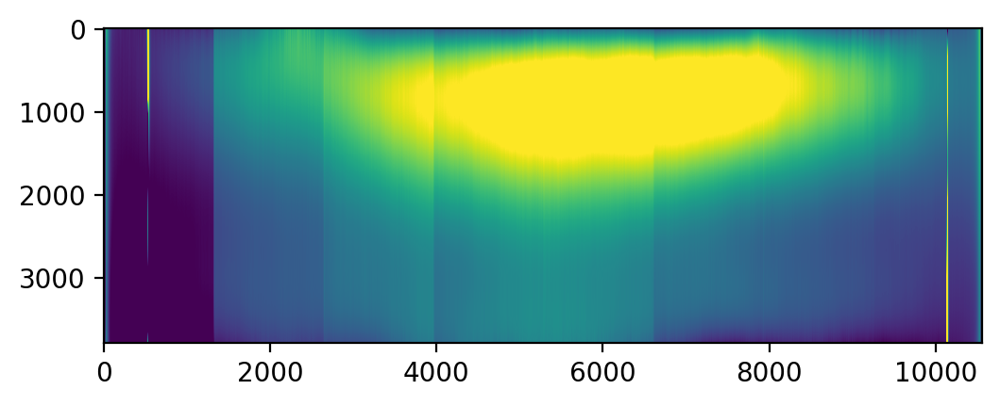

In [283]:
fig = plt.figure(dpi=200)
ax = fig.gca()
ax.imshow(bkgdata, vmin=np.percentile(bkgdata, 5), vmax=np.percentile(bkgdata, 90))
plt.show()

### 抽一维谱

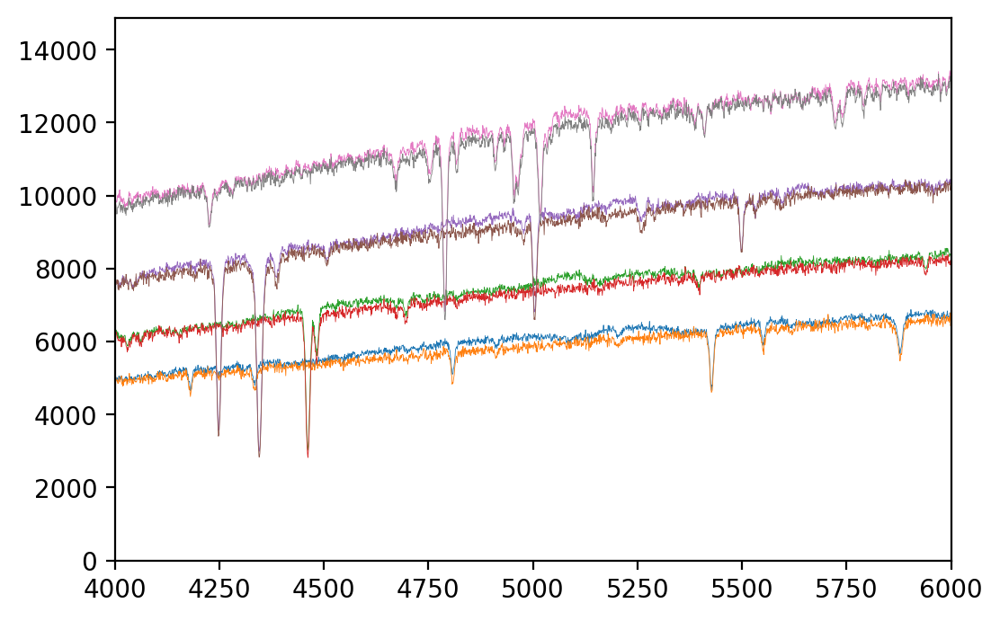

In [291]:
sdatanew = sdata/sensmap - bkgdata


spec_lst = []

fig = plt.figure(dpi=200)
ax = fig.gca()

for o, ylst in sorted(master_order_lst.items()):
    m = (yy< ylst+10)*(yy > ylst-10)
    flux = (sdata*m).sum(axis=0)
    fluxnew = (sdatanew*m).sum(axis=0)

    spec_lst.append(fluxnew)
    if 5 < o < 10:
        ax.plot(flux, lw=0.3)
        ax.plot(fluxnew, lw=0.3)
ax.set_xlim(4000, 6000)
ax.set_ylim(0,)
plt.show()


spec = np.array(spec_lst)
hdulst = fits.HDUList([fits.PrimaryHDU(data=spec)])
hdulst.writeto('pfs1146_spec.fits', overwrite=True)


### 抽ThAr灯的一维谱

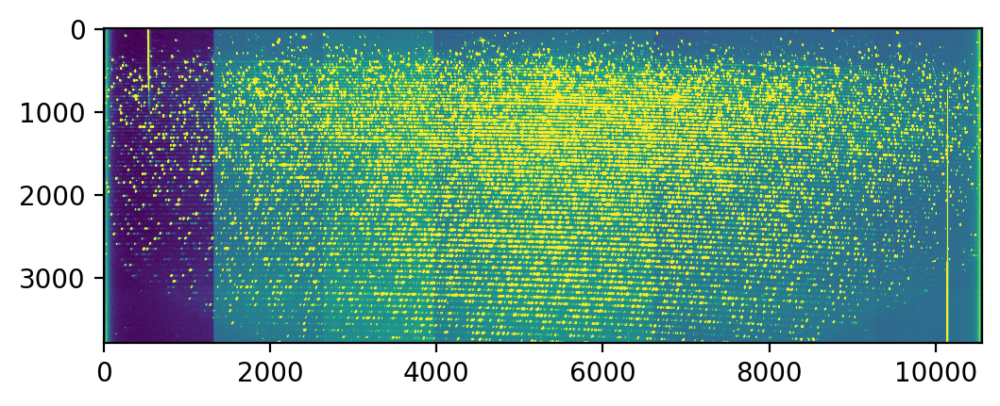

In [294]:
filename = os.path.join(rawpath, 'pfs1101.fits')
data = fits.getdata(filename)
data = data[0:3782, 0:10560] - data[0:3782, 10560+80:].mean(axis=1).reshape(-1,1)
ny, nx = data.shape

fig = plt.figure(dpi=200)
ax = fig.gca()
ax.imshow(data, vmin=np.percentile(data, 5), vmax=np.percentile(data, 90))

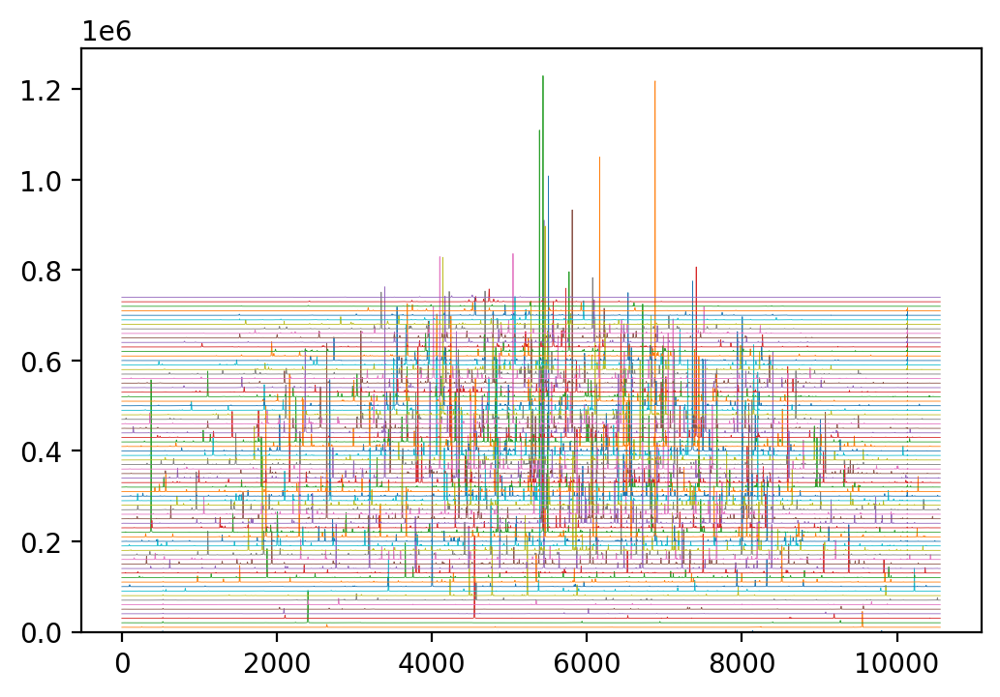

In [297]:
thar_lst = []

fig = plt.figure(dpi=200)
ax = fig.gca()
for o, ylst in sorted(master_order_lst.items()):
    m = (yy< ylst+10)*(yy > ylst-10)
    flux = (data*m).sum(axis=0)

    thar_lst.append(flux)

    ax.plot(flux + o*1e4, lw=0.3)
#ax.set_xlim(4000, 6000)
ax.set_ylim(0,)
plt.show()

In [299]:
thar_lst = np.array(thar_lst)
hdulst = fits.HDUList([fits.PrimaryHDU(data=thar_lst)])
hdulst.writeto('thar.fits', overwrite=True)


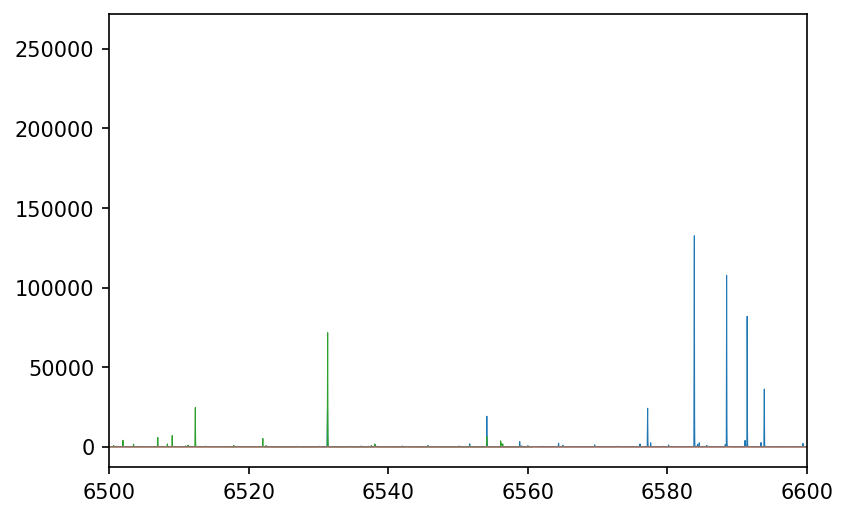

In [329]:


hdulst = fits.open('wlcalib_thar.fits')
wldata = hdulst[1].data

aper = 8
fig =plt.figure(dpi=150)
ax = fig.gca()
for aper in range(8,12):
    wavelength = wldata[aper]['wavelength']
    flux       = wldata[aper]['flux']
    
    ax.plot(wavelength, flux, lw=0.5)
    ax.plot(starwave, starflux, lw=0.5)
ax.set_xlim(6500,6600)
plt.show()

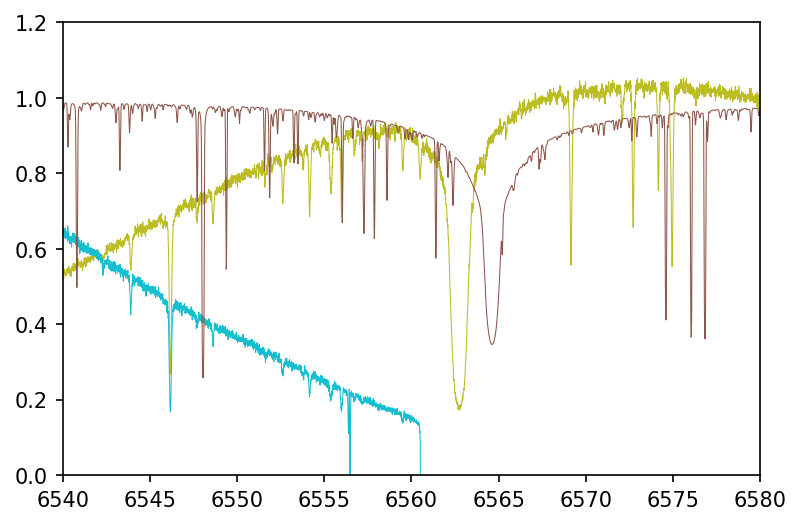

In [337]:
starwave = fits.getdata('WAVE_PHOENIX-ACES-AGSS-COND-2011.fits')
starflux = fits.getdata('lte05500-4.00-0.0.PHOENIX-ACES-AGSS-COND-2011-HiRes.fits')

i1 = np.searchsorted(starwave, 6500)
i2 = np.searchsorted(starwave, 6600)
starwave = starwave[i1:i2]
starflux = starflux[i1:i2]

starflux = starflux/(starflux.max())

fig = plt.figure(dpi=150)
ax  = fig.gca()
for o in master_order_lst.keys():
    flux = spec_lst[o]
    wavelength = wldata[o]['wavelength']
    ax.plot(wavelength, flux/10000, lw=0.5)

ax.plot(starwave, starflux, lw=0.5)
ax.set_ylim(0, 1.2)
ax.set_xlim(6540, 6580)
#ax.set_xlim(5880, 5900)
plt.show()

### 另一种用一阶和二阶导数定位级次的方法

(500.0, 1000.0)

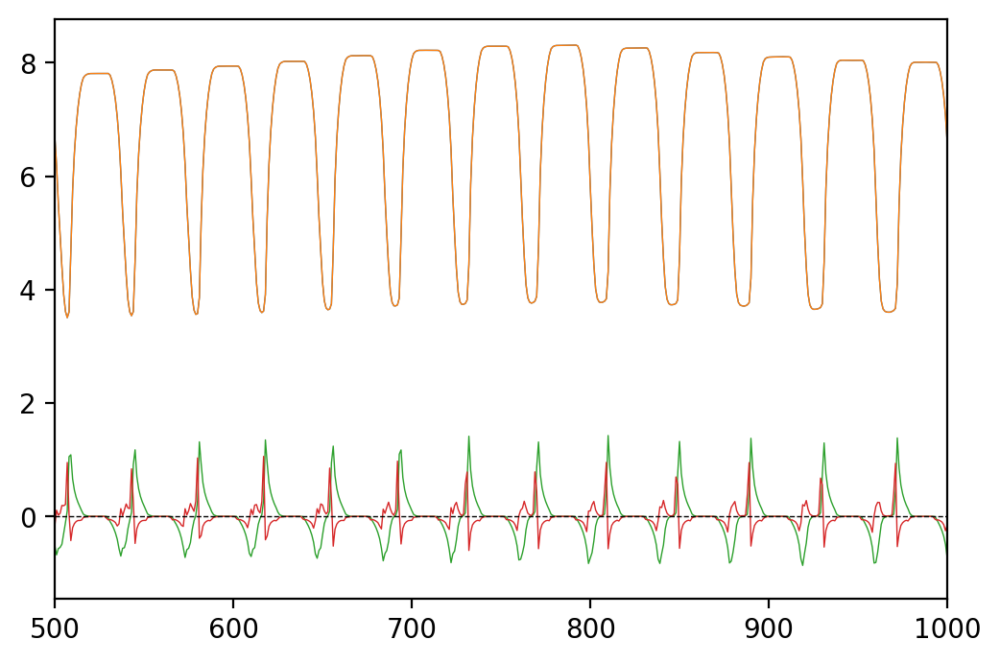

In [112]:
#from scipy.signal import savgol_filter
from scipy.signal import gaussian

ny, nx = trace.shape
newflux = trace[:, nx//2-200-2:nx//2-200+3].mean(axis=1)
core = gaussian(std=3, M=7)
core /= core.sum()
newflux = np.convolve(newflux, core, mode='same')

newflux = np.maximum(newflux, 1)
newflux = np.log(newflux)

fig = plt.figure(dpi=200)
ax = fig.gca()
ax.plot(newflux, lw=0.5)

#newflux = savgol_filter(newflux, window_length=5, polyorder=3)

ax.plot(newflux, lw=0.5)

newflux1d = np.diff(newflux)
newflux2d = np.diff(newflux1d)


ax.plot(newflux1d, lw=0.5)
ax.plot(newflux2d, lw=0.5)
ax.axhline(y=0, ls='--', lw=0.5, c='k')
ax.set_xlim(500, 1000)
#ax.set_ylim(-200, 1000)

(1500.0, 2000.0)

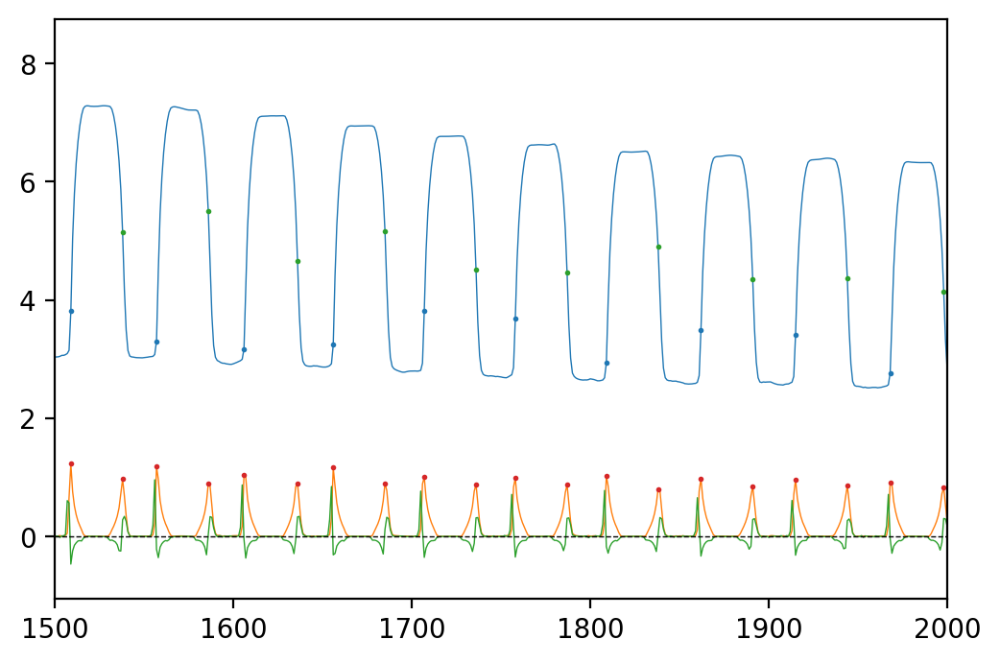

In [113]:
def get_local_minima(data):
    ind = np.diff(data) > 0
    tmp = np.logical_xor(ind, np.roll(ind,1))
    idx = np.logical_and(tmp,ind)
    return np.where(idx)[0]

def get_local_minima_window(data, window):
    
    ind = np.diff(data) > 0
    tmp = np.logical_xor(ind, np.roll(ind,1))
    idx = np.logical_and(tmp,ind)
    
    halfwin = (window-1)//2
    
    index_lst = []
    for i in np.where(idx)[0]:
        i1 = max(0, i-halfwin)
        i2 = min(i+halfwin+1, len(data))
        if i == data[i1:i2].argmin() + i1:
            index_lst.append(i)
    return np.array(index_lst)

imax = get_local_minima_window(-np.abs(newflux1d), window=7)
imax = imax[np.abs(newflux1d)[imax]>0.1]

m = [newflux2d[i-1]>0 and newflux2d[i]<0 for i in imax]
ileft = imax[m]

m = [newflux2d[i-1]<0 and newflux2d[i]>0 for i in imax]
iright = imax[m]

fig = plt.figure(dpi=200)
ax = fig.gca()
ax.plot(newflux, lw=0.5)
ax.plot(np.abs(newflux1d), lw=0.5)
ax.plot(newflux2d, lw=0.5)
ax.plot(np.arange(ny)[imax], np.abs(newflux1d)[imax], 'o', ms=1)
ax.plot(np.arange(ny)[ileft], newflux[ileft], 'o', ms=1, c='C0')
ax.plot(np.arange(ny)[iright], newflux[iright], 'o', ms=1, c='C2')
ax.axhline(y=0, ls='--', lw=0.5, c='k')
ax.set_xlim(1500, 2000)


[(15, 39), (45, 71), (75, 102), (106, 133), (138, 165), (170, 197), (202, 230), (234, 262), (267, 295), (301, 329), (334, 362), (368, 396), (403, 431), (438, 466), (473, 501), (509, 537), (545, 573), (581, 610), (618, 647), (656, 684), (694, 722), (732, 760), (771, 799), (810, 839), (850, 878), (890, 919), (931, 959), (972, 1001), (1014, 1043), (1056, 1085), (1099, 1128), (1142, 1171), (1186, 1215), (1230, 1259), (1275, 1304), (1321, 1350), (1367, 1396), (1414, 1443), (1461, 1490), (1509, 1538), (1557, 1586), (1606, 1636), (1656, 1685), (1707, 1736), (1758, 1787), (1809, 1838), (1862, 1891), (1915, 1944), (1968, 1998), (2023, 2052), (2078, 2107), (2134, 2163), (2191, 2220), (2248, 2277), (2306, 2336), (2365, 2395), (2425, 2455), (2486, 2515), (2547, 2577), (2609, 2639), (2673, 2702), (2737, 2766), (2802, 2831), (2868, 2897), (2935, 2964), (3002, 3032), (3071, 3101), (3141, 3170), (3212, 3241), (3284, 3313), (3357, 3386), (3432, 3460), (3508, 3534), (3584, 3611), (3662, 3689)]


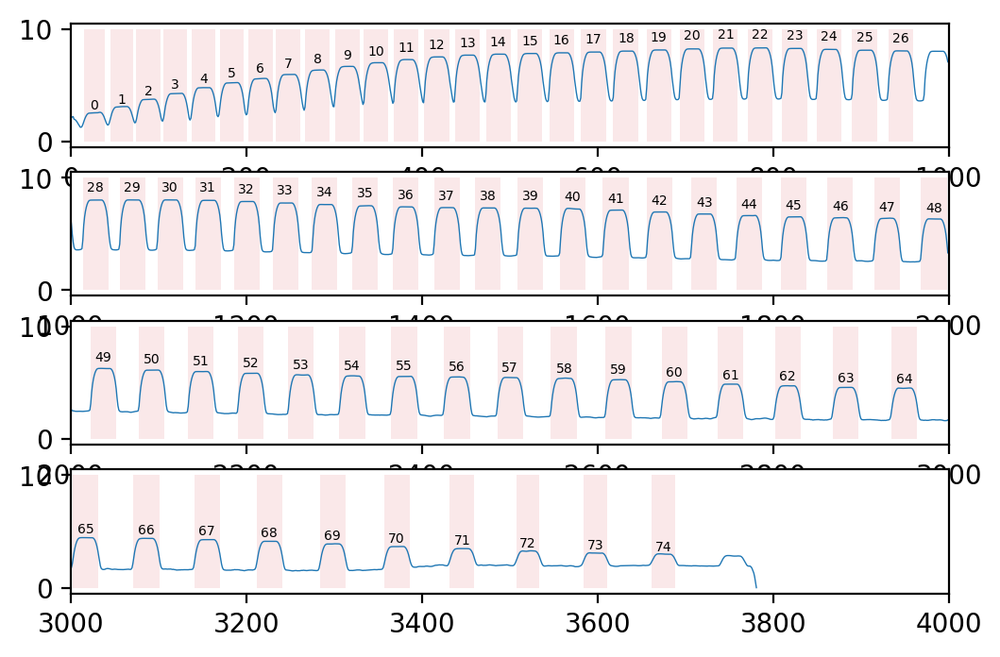

In [53]:
order_lst = []
for i1 in np.arange(ileft.size-1):
    _ileft = ileft[i1]
    _ileft_next = ileft[i1+1]
    if iright[iright > _ileft][0] < _ileft_next:
        _iright = iright[iright > _ileft][0]
        order_lst.append((_ileft, _iright))
print(order_lst)


fig = plt.figure(dpi=200)
for i in range(4):
    
    ax = fig.add_subplot(411+i)
    i1, i2 = i*1000, i*1000+1000
    ax.plot(np.arange(ny)[i1:i2], newflux[i1:i2], lw=0.5)
    for io, (y1, y2) in enumerate(order_lst):
        if i1<y1<i2 and i1<y2<i2:
            ax.fill_betweenx([0,10], y1, y2, color='C3', alpha=0.1, lw=0)
            ax.text((y1+y2)/2, newflux[y1:y2].max()*1.1, str(io), ha='center', fontsize=5)
    ax.set_xlim(i1, i2)

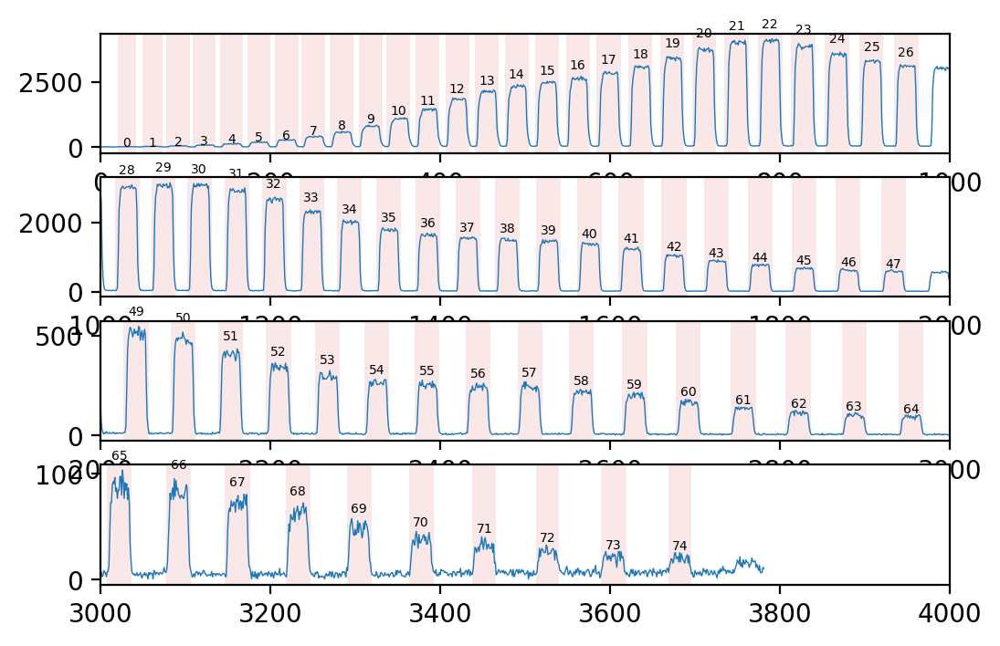

In [54]:
def get_orders2(flux):
    core = gaussian(std=3, M=7)
    core /= core.sum()
    flux = np.convolve(flux, core, mode='same')

    newflux = np.maximum(flux, 1)
    newflux = np.log(newflux)
    newflux1d = np.diff(newflux)
    newflux2d = np.diff(newflux1d)
    
    imax = get_local_minima_window(-np.abs(newflux1d), window=7)
    imax = imax[np.abs(newflux1d)[imax]>0.1]

    m = [newflux2d[i-1]>0 and newflux2d[i]<0 for i in imax]
    ileft = imax[m]

    m = [newflux2d[i-1]<0 and newflux2d[i]>0 for i in imax]
    iright = imax[m]
    
    order_lst = []
    for i1 in np.arange(ileft.size-1):
        _ileft = ileft[i1]
        _ileft_next = ileft[i1+1]
        m = iright > _ileft
        if m.sum()>0:
            if iright[m][0] < _ileft_next:
                _iright = iright[m][0]
                if _iright - _ileft > 10:
                    f = flux[_ileft:_iright].mean()
                    order_lst.append((_ileft, _iright, f))
    return order_lst

flux = newdata[:, nx//2]

mainorder_lst = get_orders2(flux)

fig = plt.figure(dpi=200)
for i in range(4):
    ax = fig.add_subplot(411+i)
    i1, i2 = i*1000, i*1000+1000
    ax.plot(np.arange(ny)[i1:i2], flux[i1:i2], lw=0.5)
    _y1, _y2 = ax.get_ylim()
    for io, (y1, y2, f) in enumerate(mainorder_lst):
        if i1<y1<i2 and i1<y2<i2:
            ax.fill_betweenx([_y1, _y2], y1, y2, color='C3', alpha=0.1, lw=0)
            ax.text((y1+y2)/2, flux[y1:y2].max()*1.1, str(io), ha='center', fontsize=5)
    ax.set_xlim(i1, i2)
    ax.set_ylim(_y1, _y2)

[(20, 42, 12.534061178445826), (49, 73, 20.883576074098922), (78, 105, 35.90194570243998), (109, 136, 58.25044429962467), (141, 168, 99.11014094173436), (173, 200, 146.8149035079255), (205, 233, 213.33349179718587), (237, 265, 308.9979922109067), (270, 298, 443.99546544997014), (304, 332, 623.6203378949613), (337, 365, 834.8334948090405), (371, 399, 1108.7778800911515), (406, 434, 1416.874266342654), (441, 469, 1657.133443272661), (476, 504, 1803.6514710961092), (512, 540, 1929.4327919354018), (548, 576, 2037.3797503801723), (584, 613, 2138.5086885165883), (622, 650, 2403.084079854642), (659, 687, 2655.6658537775215), (697, 725, 2920.861274872532), (735, 764, 3058.640473057969), (774, 803, 3116.260789614722), (813, 842, 2943.8920688917815), (853, 882, 2714.489330244521), (894, 922, 2601.322582459222), (934, 963, 2380.4232195468603), (976, 1004, 2380.6137731509475), (1017, 1046, 2302.6960513367912), (1060, 1088, 2419.318815022908), (1102, 1131, 2355.5526164200464), (1146, 1175, 2247.962

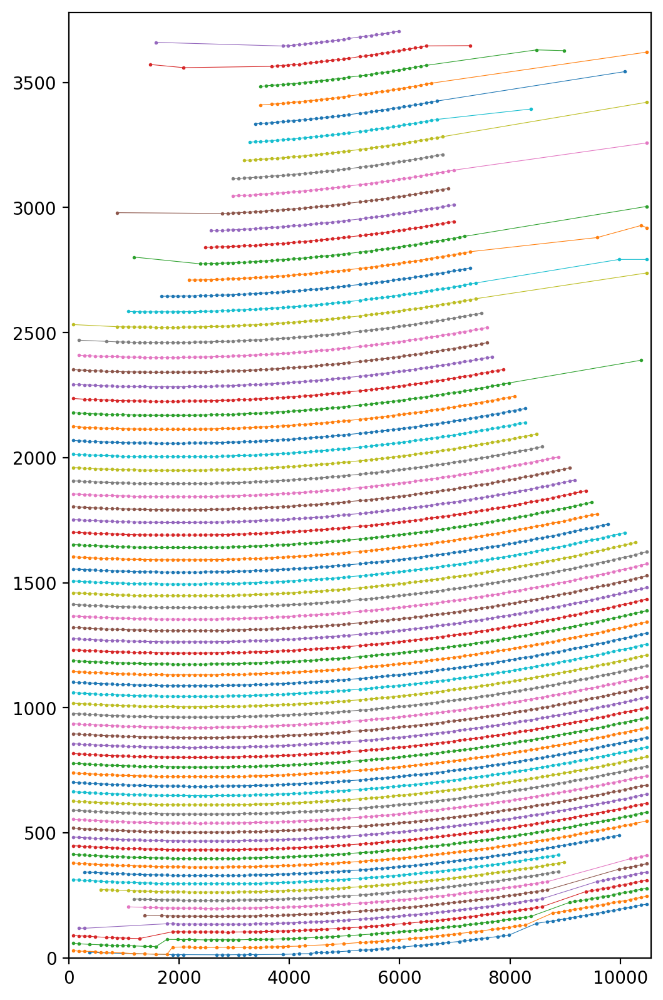

In [80]:
orderx_lst = {}
ordery_lst = {}
orderw_lst = {}
for io, (i1, i2, f) in enumerate(mainorder_lst):
    orderx_lst[io] = [nx/2]
    ordery_lst[io] = [(i1+i2)/2]
    orderw_lst[io] = [f]

mainorder_pos = {io: (i1+i2)/2 for io, (i1, i2, f) in enumerate(mainorder_lst)}

#######################################

for x in np.arange(nx//2+100, nx, 100):
    newflux = newdata[:, x-2:x+3].mean(axis=1)
    order_lst = get_orders2(newflux)
    
    lastylst = {o: ylst[-1] for o, ylst in sorted(ordery_lst.items())}
    
    distmin_lst = []
    for order in order_lst:
        c = (order[0] + order[1])/2
        dist_lst = [c-y for o, y in sorted(lastylst.items())]
        argmin = np.abs(dist_lst).argmin()
        distmin_lst.append(dist_lst[argmin])
    shift = np.median(distmin_lst)
    
    mainorder_pos = {io: v+shift for io, v in mainorder_pos.items()}

    for order in order_lst:
        c = (order[0] + order[1])/2
        f = order[2]
        dist_lst = [abs(c - y) for o, y in sorted(mainorder_pos.items())]
        i = np.argmin(dist_lst)
        if dist_lst[i] < 15:
            orderx_lst[i].append(x)
            ordery_lst[i].append(c)
            orderw_lst[i].append(f)

mainorder_pos = {io: (i1+i2)/2 for io, (i1, i2, f) in enumerate(mainorder_lst)}

#######################################
for ix, x in enumerate(np.arange(nx//2-200, 0, -100)):
    newflux = newdata[:, x-2:x+3].mean(axis=1)
    order_lst = get_orders2(newflux)
    
    if ix == 0:
        lastylst = {o: ylst[0] for o, ylst in sorted(ordery_lst.items())}
    else:
        lastylst = {o: ylst[-1] for o, ylst in sorted(ordery_lst.items())}
    
    distmin_lst = []
    for order in order_lst:
        c = (order[0] + order[1])/2
        dist_lst = [c-y for o, y in sorted(lastylst.items())]
        argmin = np.abs(dist_lst).argmin()
        distmin_lst.append(dist_lst[argmin])
    shift = np.median(distmin_lst)
    
    mainorder_pos = {io: v+shift for io, v in mainorder_pos.items()}
        
    for order in order_lst:
        c = (order[0] + order[1])/2
        f = order[2]
        dist_lst = [abs(c - y) for o, y in sorted(mainorder_pos.items())]
        i = np.argmin(dist_lst)
        if dist_lst[i] < 15:
            orderx_lst[i].append(x)
            ordery_lst[i].append(c)
            orderw_lst[i].append(f)



fig = plt.figure(dpi=200, figsize=(6, 10))
ax = fig.gca()

master_order_lst = {}
ny, nx = trace.shape
for o in orderx_lst.keys():
    xdata = np.array(orderx_lst[o])
    ydata = np.array(ordery_lst[o])
    wdata = np.array(orderw_lst[o])
    
    arg = np.argsort(xdata)
    xdata = xdata[arg]
    ydata = ydata[arg]
    wdata = ydata[arg]
    ax.plot(xdata, ydata, 'o-', ms=1, lw=0.4)
    
    fitfunc = lambda p, x: p[0]*x**3 + p[1]*x**2 + p[2]*x + p[3]
    errfunc = lambda p, x, y, w:  w*(y - fitfunc(p,x))
    
    #mask = np.ones_like(xdata, dtype=bool)
    #for i in range(3):
    #    fitres = opt.least_squares(errfunc, [0, 0, 0, ydata[mask].mean()], args=(xdata[mask]/10000, ydata[mask], wdata[mask]))
    #    p = fitres['x']
    #    res_lst = ydata - fitfunc(p, xdata)
    #    std = res_lst[mask].std()
    #    newmask = np.abs(res_lst) < 3*std
    #    mask = newmask
    #    
    #ax.plot(xdata[mask], ydata[mask], 'o', ms=1, lw=0.5, mew=0)
    #ax.plot(xdata[~mask], ydata[~mask], 'o', ms=1, lw=0.5, mew=0, c='k')
    newx = np.arange(nx)
    #newy = fitfunc(p, newx/10000)
    #ax.plot(newx, newy, lw=0.5)
    ax.set_xlim(0, nx-1)
    ax.set_ylim(0, ny-1)
    
    master_order_lst[o] = newy

## 一些技巧

### 避免逐个遍历Numpy数组中的元素

In [215]:
import time
import numpy as np

a = np.arange(90).reshape(6,15)
print(a)

[[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
 [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
 [45 46 47 48 49 50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69 70 71 72 73 74]
 [75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]]


In [219]:
t1 = time.time()
over_lst = []
for i in range(15):
    median = np.median(a[:,i])
    over_lst.append(median)
t2 = time.time()

print(t2-t1)
print(over_lst)

0.0020821094512939453
[37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5, 44.5, 45.5, 46.5, 47.5, 48.5, 49.5, 50.5, 51.5]


In [221]:
t1 = time.time()
over_lst = np.median(a, axis=0)
t2 = time.time()

print(t2-t1)
print(over_lst)

0.00023055076599121094
[37.5 38.5 39.5 40.5 41.5 42.5 43.5 44.5 45.5 46.5 47.5 48.5 49.5 50.5
 51.5]


numpy 数组中很多常用方法可以对某个特定的维度（或方向，axis）进行操作。例如：

In [224]:
print(a.mean())   # 计算数组a中全部元素的平均值
print(a.mean(axis=0))  # 逐列计算数组a中元素的平均值
print(a.mean(axis=1)) # 逐行计算数组a中元素的平均值

44.5
[37.5 38.5 39.5 40.5 41.5 42.5 43.5 44.5 45.5 46.5 47.5 48.5 49.5 50.5
 51.5]
[ 7. 22. 37. 52. 67. 82.]


类似地，`numpy.median()` 函数也支持对指定的维度进行操作。例如：

In [228]:
print(np.median(a))   #  计算数组a中全部元素的中值
print(np.median(a, axis=0))  # 逐列计算数组a中元素的中值
print(np.median(a, axis=1))  # 逐行计算数组a中元素的中值

44.5
[37.5 38.5 39.5 40.5 41.5 42.5 43.5 44.5 45.5 46.5 47.5 48.5 49.5 50.5
 51.5]
[ 7. 22. 37. 52. 67. 82.]


### 数组广播

In [236]:
a = np.ones((3,3))
b = np.arange(3)
print(a)
print(b)

[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]
[0 1 2]


In [237]:
print(a+b)

[[1. 2. 3.]
 [1. 2. 3.]
 [1. 2. 3.]]


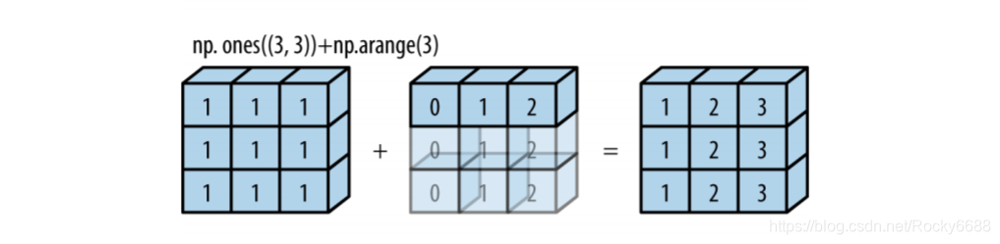

同理，也可以对列进行广播：

In [253]:
a = np.arange(12).reshape(3,4)
b = np.arange(5,8).reshape(-1,1)
print(a)
print(b)

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]
[[5]
 [6]
 [7]]


In [254]:
print(a+b)

[[ 5  6  7  8]
 [10 11 12 13]
 [15 16 17 18]]


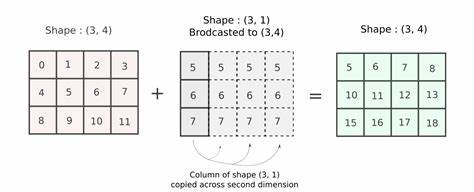

利用数组广播，overscan改正可以用一行代码完成

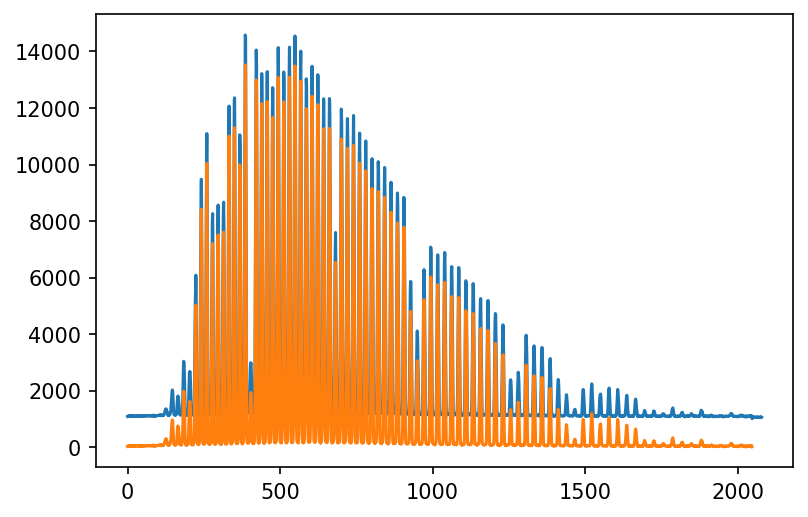

In [249]:
import astropy.io.fits as fits

rawpath = 'data/apf.levy/2013-10-10'
filename = os.path.join(rawpath, 'ucsc57091.fits')
data = fits.getdata(filename)

datanew = data[:,0:2048] - np.median(data[:,2048:], axis=1).reshape(-1,1)

fig = plt.figure(dpi=150)
ax = fig.gca()
ax.plot(data[1000])
ax.plot(datanew[1000])

**但是在接触新的数据时，还是建议对一些关键步骤多多画图，并进行人眼检查！**